<a href="https://colab.research.google.com/github/srilamaiti/ml_works/blob/main/sales_forecast_str_csc_day_level.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Installing New Libraries**

In [1]:
!pip install python-weather
!pip install meteostat
!pip install geopandas
!pip install geopy
!pip install pgeocode
!pip install pyowm
!pip install wwo-hist
!pip install openweathermap_requests
!pip install holidays
!pip install shap
!pip install optuna
!pip install hyperopt 
!pip install yellowbrick
!pip install interpret
!pip install ngboost
!pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for python-weather: filename=python_weather-0.4.3-py3-none-any.whl size=10344 sha256=ac9f6116f16d4a81956b11f276912dbdccc4fdbaacc156e306f7c0a1beb71da0
  Stored in directory: /root/.cache/pip/wheels/b7/7a/c7/f84adc5c4e3f87615013b2987856750dc521729dc43d656e3d
Successfully built python-weather
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 5.1 MB/s 
     |████████████████████████████████| 6.3 MB 48.7 MB/s 
     |████████████████████████████████| 16.7 MB 41.6 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: http

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 61 kB 410 kB/s 
     |████████████████████████████████| 349 kB 40.9 MB/s 
     |████████████████████████████████| 41 kB 336 kB/s 
     |████████████████████████████████| 66 kB 4.6 MB/s 
     |████████████████████████████████| 77 kB 5.8 MB/s 
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4049 sha256=5e43ff544bb8722cec51c6c1df301e0830d87584171f114461437bb66d10ec5a
  Stored in directory: /root/.cache/pip/wheels/9f/01/ee/1331593abb5725ff7d8c1333aee93a50a1c29d6ddda9665c9f
Successfully built autograd-gamma
  Attempting uninstall: typing-extensions
    Found existing installation: typing-extensions 4.1.1
    Uninstalling typing-extensions-4.1.1:
      Successfully uninstalled typing-extensions-4.1.1
  Attempting uninstall: importlib-metadata
    Found existing installation: importlib-metadata 4.13.0
    Uninstallin

# **Importing Libraries**

In [2]:
from interpret.glassbox import ExplainableBoostingClassifier
from interpret.glassbox import ExplainableBoostingRegressor
from interpret import show
from interpret import perf
from scipy.stats import norm
from yellowbrick.regressor import residuals_plot
from yellowbrick.regressor import prediction_error
import lightgbm as lgb
import matplotlib.pyplot as plt
from datetime import datetime
from meteostat import Point, Daily
from geopy.geocoders import Nominatim
import xgboost
print(xgboost.__version__)
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import pgeocode
import numpy as np
import pyowm
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV
import catboost as cb

from wwo_hist import retrieve_hist_data
from openweathermap_requests import OpenWeatherMapRequests
from statsmodels.formula.api import ols
import statsmodels.api as sm
import holidays
import datetime
from datetime import date
from datetime import timedelta
from matplotlib.pyplot import figure
import xgboost as xgb
from xgboost import plot_importance, plot_tree
import matplotlib.ticker as ticker
import shap

0.90


In [3]:
pd.set_option('display.max_columns', None)
pd.set_option("display.precision", 8)

# **Holiday**

In [4]:
class holiday:
    """
    This class lists both Federal and State holidays for current year 
    and next 9 years.
    """
    def __init__(self):
        """
        This initialization method obtains current year and lists all USA states.
        """
        self.current_year = date.today().year
        self.states_list = [ 'AK', 'AL', 'AR', 'AZ', 'CA', 
                             'CO', 'CT', 'DC', 'DE', 'FL', 
                             'GA', 'HI', 'IA', 'ID', 'IL', 
                             'IN', 'KS', 'KY', 'LA', 'MA', 
                             'MD', 'ME', 'MI', 'MN', 'MO', 
                             'MS', 'MT', 'NC', 'ND', 'NE', 
                             'NH', 'NJ', 'NM', 'NV', 'NY', 
                             'OH', 'OK', 'OR', 'PA', 'RI', 
                             'SC', 'SD', 'TN', 'TX', 'UT', 
                             'VA', 'VT', 'WA', 'WI', 'WV', 'WY'
                            ]
        self.holiday_date_list = []
        self.holiday_details_list = []
        self.df_holiday = pd.DataFrame()
    
    def collect_federal_holiday_list(self):
        """
        This method lists all federal holidays along with observed ones
        in USA in a given year.
        """
        for year in range(self.current_year-3, self.current_year + 11):
            # Print all the holidays in United States in the year 
            for federal_holiday_val in holidays.UnitedStates(years = year, observed = True).items():
                print(f"Federal Holiday :: {str(federal_holiday_val[0])} :: {federal_holiday_val[1]}")
                self.holiday_date_list.append(federal_holiday_val[0])
                self.holiday_details_list.append(('FE', 
                                                  year, 
                                                  str(federal_holiday_val[0]), 
                                                  federal_holiday_val[1]
                                                 )
                                                )

    def collect_state_holiday_list(self):
        """
        This method lists all state holidays along with observed ones
        in USA in a given year which are not federal holidays.
        """
        for year in range(self.current_year-3, self.current_year + 11):
            for state in self.states_list:
                for state_holiday_val in holidays.UnitedStates(years = year, observed = True, subdiv = state).items():
                    if state_holiday_val[0] not in self.holiday_date_list:
                        print(f"State {state} Holiday :: {str(state_holiday_val[0])} :: {state_holiday_val[1]}")
                        self.holiday_date_list.append(state_holiday_val[0])
                        self.holiday_details_list.append((state, 
                                                          year, 
                                                          str(state_holiday_val[0]), 
                                                          state_holiday_val[1]
                                                          )
                                                        )
    
    def get_holiday(self, year):
        """
        This method provides the list of federal and state holidays 
        in a given year. It also writes the data in a csv file with name format 
        as holiday_list_<<4 digit year, comes from input parameter>>.csv.
        """
        yearly_holiday_list = []
        print(f"List of holidays in {year}:-")
        #print(self.holiday_details_list)
        for holiday_val in self.holiday_details_list:
            if holiday_val[1] == year:
                print(f"{holiday_val[0]} :: {holiday_val[1]} :: {holiday_val[2]} :: {holiday_val[3]}")
                yearly_holiday_list.append(holiday_val)
        self.df_holiday = pd.DataFrame(yearly_holiday_list, columns =['level', 'year', 'date', 'holiday_name'])
        #print(self.df_holiday)
        self.df_holiday.to_csv('holiday_list_' + str(year) + '.csv', index = False)
        return self.df_holiday
    
    def __repr__(self):
        """
        This method prints states list and current year.
        """
        print(f"Current Year : {self.current_year}")
        print(f"State List : {self.states_list}")

    def __str__(self):
        """
        This method prints states list and current year.
        """
        print(f"Current Year : {self.current_year}")
        print(f"State List : {self.states_list}") 

current_year = date.today().year
hdy = holiday()
help(holiday)
hdy.collect_federal_holiday_list()
hdy.collect_state_holiday_list()

current_year_hdy = hdy.get_holiday(current_year)
one_year_ago_year_hdy = hdy.get_holiday(current_year-1)
two_year_ago_year_hdy = hdy.get_holiday(current_year-2)
three_year_ago_year_hdy = hdy.get_holiday(current_year-3)
df_holiday_combined = pd.concat([current_year_hdy, one_year_ago_year_hdy, two_year_ago_year_hdy])

Help on class holiday in module __main__:

class holiday(builtins.object)
 |  This class lists both Federal and State holidays for current year 
 |  and next 9 years.
 |  
 |  Methods defined here:
 |  
 |  __init__(self)
 |      This initialization method obtains current year and lists all USA states.
 |  
 |  __repr__(self)
 |      This method prints states list and current year.
 |  
 |  __str__(self)
 |      This method prints states list and current year.
 |  
 |  collect_federal_holiday_list(self)
 |      This method lists all federal holidays along with observed ones
 |      in USA in a given year.
 |  
 |  collect_state_holiday_list(self)
 |      This method lists all state holidays along with observed ones
 |      in USA in a given year which are not federal holidays.
 |  
 |  get_holiday(self, year)
 |      This method provides the list of federal and state holidays 
 |      in a given year. It also writes the data in a csv file with name format 
 |      as holiday_list_<<4 d

In [5]:
df_holiday_combined

,level,year,date,holiday_name
0,FE,2022,2022-01-01,New Year's Day
1,FE,2022,2022-01-17,Martin Luther King Jr. Day
2,FE,2022,2022-02-21,Washington's Birthday
3,FE,2022,2022-05-30,Memorial Day
4,FE,2022,2022-06-19,Juneteenth National Independence Day
...,...,...,...,...
44,VA,2020,2020-01-17,Lee Jackson Day
45,VT,2020,2020-03-03,Town Meeting Day
46,VT,2020,2020-08-16,Bennington Battle Day
47,VT,2020,2020-08-17,Bennington Battle Day (Observed)


# **Setting up the Period**

In [6]:
# Set time period
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 10, 31)

# **Getting Weather Data at Day and Zipcode Level**

In [7]:
df_weather = pd.read_csv('result_3zip_weather.csv')
df_weather.columns = [col.lower() for col in df_weather.columns]
df_weather['zip5'] = df_weather['zip5'].astype(str)
df_weather['zip5'] = df_weather['zip5'].apply(lambda x : x.zfill(5))
df_weather.head()

,zip5,day_dt,high_temperature_amt,low_temperature_amt,sky_cd,precipitation_cd,temperature_cd,air_cd,uv_index_dsc,wind_speed_amt,humidity_pct,dew_point_amt,rain_fall_amt,snow_fall_amt,comfort_index_amt,precipitation_probability_pct,feed_cd,last_update_ts
0,01749,2019-03-20,50.8,24.3,1,0,6,30,LOW,14.9,30,18.8,0.0,0.0,44.8,3,OTH,2019-03-20 07:31:11.000 -0600
1,02747,2019-03-20,52.2,21.7,1,0,6,22,LOW,17.9,29,19.2,0.0,0.0,46.1,0,OTH,2019-03-20 07:31:11.000 -0600
2,05673,2019-03-20,44.9,16.9,3,0,6,0,LOW,11.9,47,23.1,0.0,0.0,37.1,6,OTH,2019-03-20 07:31:11.000 -0600
3,01749,2019-03-21,51.5,32.2,26,66,6,30,MINIMAL,14.9,41,26.5,0.5,0.0,46.1,93,OTH,2019-03-21 07:31:31.000 -0600
4,02747,2019-03-21,53.1,31.7,12,66,6,30,MINIMAL,32.8,38,26.1,0.5,0.0,46.1,99,OTH,2019-03-21 07:31:31.000 -0600


In [8]:
df_weather['zip5'].drop_duplicates()

0    01749
1    02747
2    05673
Name: zip5, dtype: object

# **Loading 5 digit zip codes for Shaws stores.**

In [9]:
df_zip = pd.read_csv('zipcode.txt')
df_zip.columns = [col.lower() for col in df_zip.columns]
df_zip = df_zip.drop_duplicates()
df_zip['zipcode'] = df_zip['zipcode'].apply(lambda x : x.replace("'",""))
df_zip.head()

,zipcode
0,05602
1,02067
2,04530
3,02199
4,02126


In [10]:
df_zip[df_zip.zipcode == '03458']

,zipcode
148,03458


# **Loading Shaw's Stores Store-Zipcode Combination Data**

In [11]:
df_str_zip = pd.read_csv('store_zipcode.txt')
df_str_zip['zip_code'] = df_str_zip['zip_code'].astype(str)
df_str_zip['zip_code'] =  df_str_zip['zip_code'].apply(lambda x : x.zfill(5))
df_str_zip.columns = ['store_id', 'zip_code']
df_str_zip.rename(columns={'zip_code':'zip5'}, inplace = True)
df_str_zip.head()

,store_id,zip5
0,121,05602
1,418,02067
2,553,04530
3,602,02199
4,604,02126


In [12]:
df_str_zip[df_str_zip.zip5 == '03458']

,store_id,zip5
148,4694,03458


# **Combining weather and zip code data together.**

In [13]:
df_weather = pd.merge(df_weather, df_str_zip, how = 'inner', on = 'zip5')

In [14]:
df_weather.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'sky_cd', 'precipitation_cd', 'temperature_cd', 'air_cd',
       'uv_index_dsc', 'wind_speed_amt', 'humidity_pct', 'dew_point_amt',
       'rain_fall_amt', 'snow_fall_amt', 'comfort_index_amt',
       'precipitation_probability_pct', 'feed_cd', 'last_update_ts',
       'store_id'],
      dtype='object')

In [15]:
df_weather = df_weather [['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'sky_cd', 'precipitation_cd', 'temperature_cd', 'air_cd',
       'uv_index_dsc', 'wind_speed_amt', 'humidity_pct', 'dew_point_amt',
       'rain_fall_amt', 'snow_fall_amt', 'comfort_index_amt',
       'precipitation_probability_pct', 'feed_cd', 
       'store_id']]
df_weather = df_weather[df_weather['zip5'].isin(['02747','05673','05764'])]

In [16]:
df_weather.iloc[0]

zip5                                  02747
day_dt                           2019-03-20
high_temperature_amt                   52.2
low_temperature_amt                    21.7
sky_cd                                    1
precipitation_cd                          0
temperature_cd                            6
air_cd                                   22
uv_index_dsc                            LOW
wind_speed_amt                         17.9
humidity_pct                             29
dew_point_amt                          19.2
rain_fall_amt                           0.0
snow_fall_amt                           0.0
comfort_index_amt                      46.1
precipitation_probability_pct             0
feed_cd                                 OTH
store_id                                619
Name: 1329, dtype: object

# **Getting historical min, max and avg temp weather data on a particular day and zipcode level.**

05602


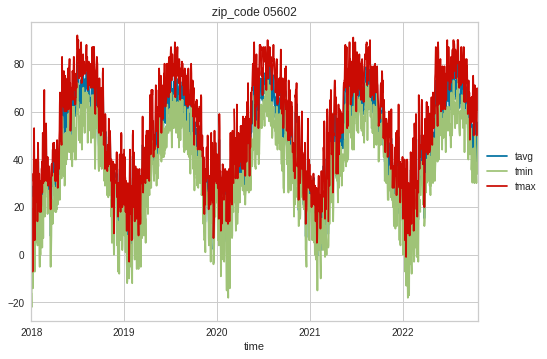

02067


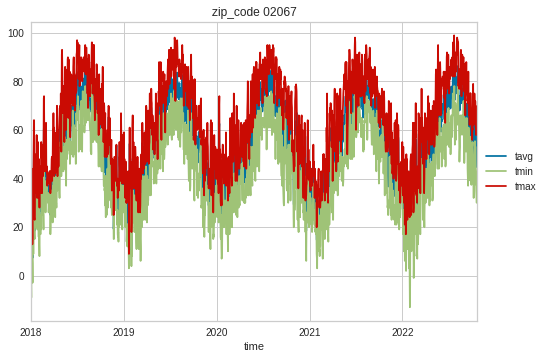

04530


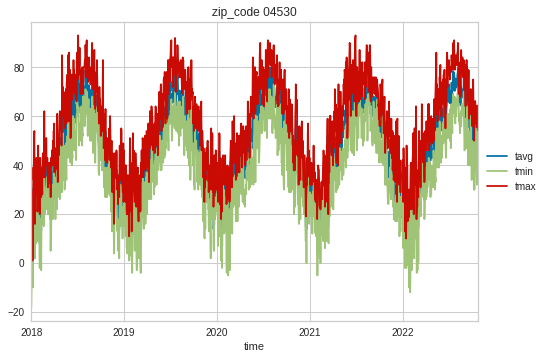

02199


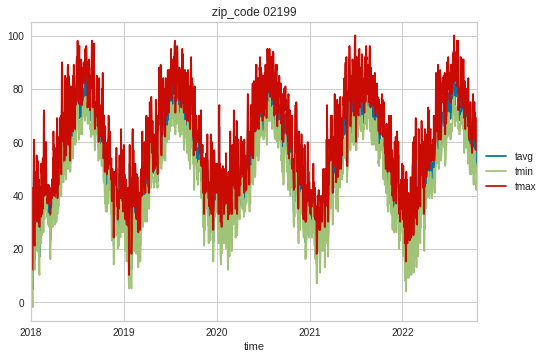

02126


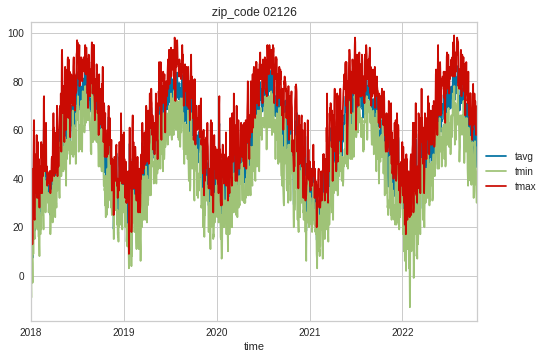

05446


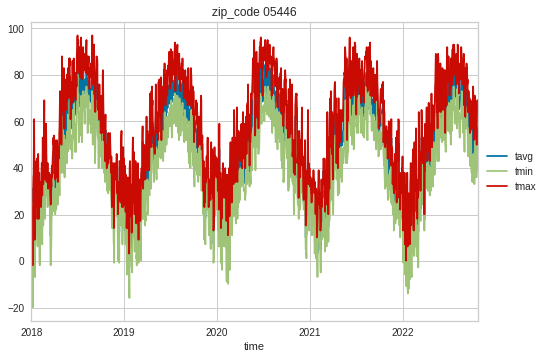

02747


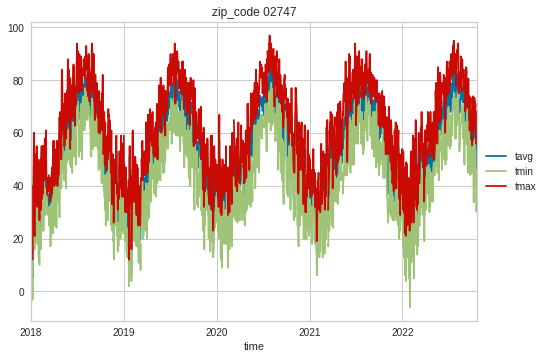

01757


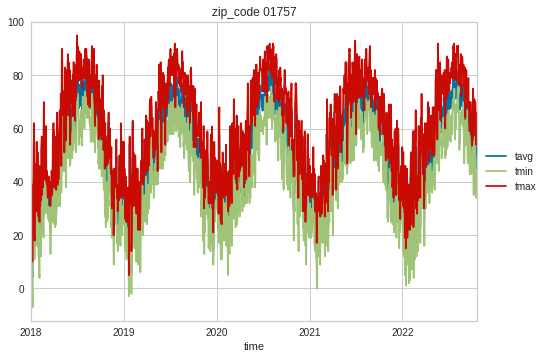

03087


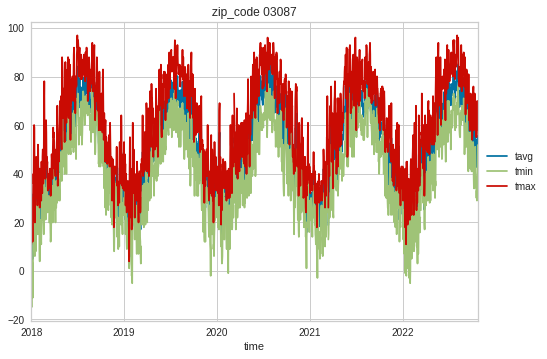

02341


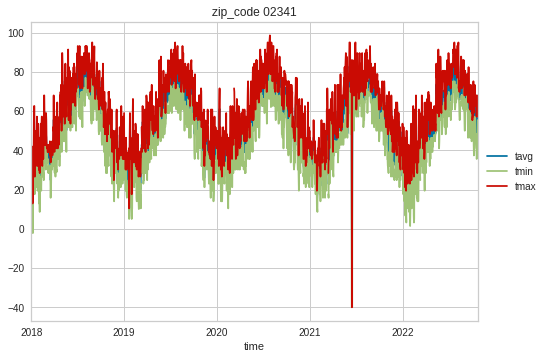

02720


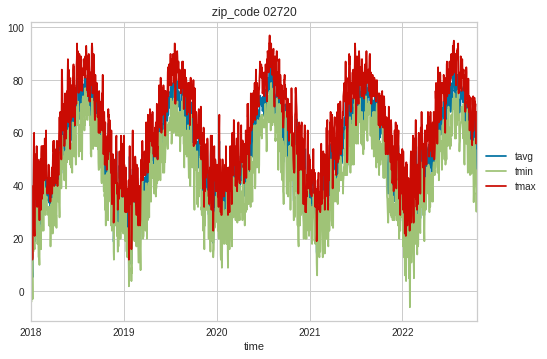

02052


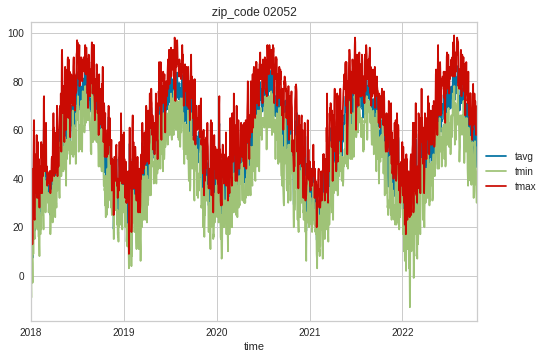

01721


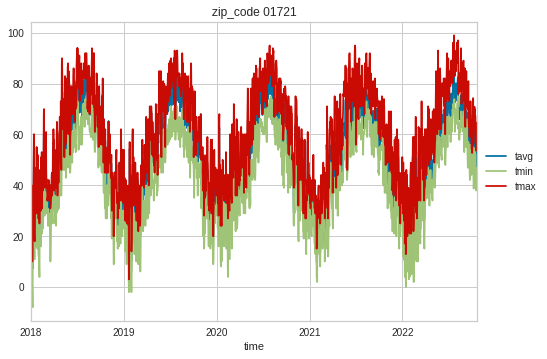

02453


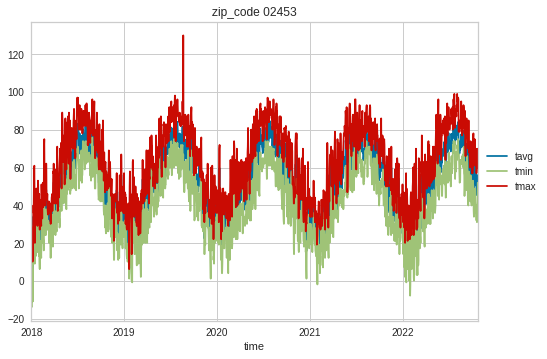

02025


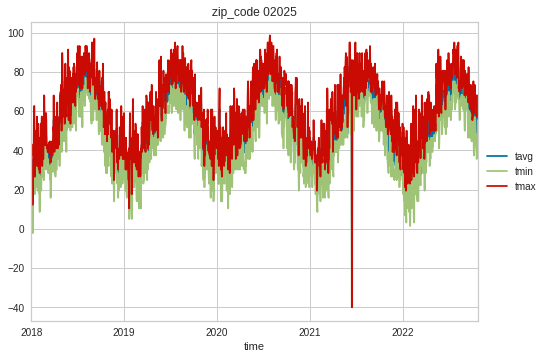

05495


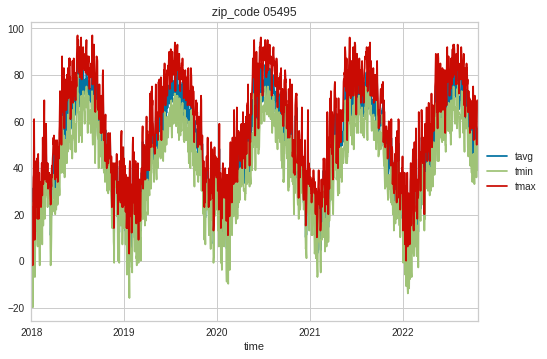

03785


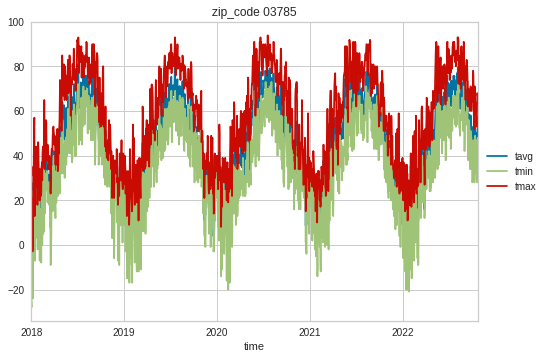

04210


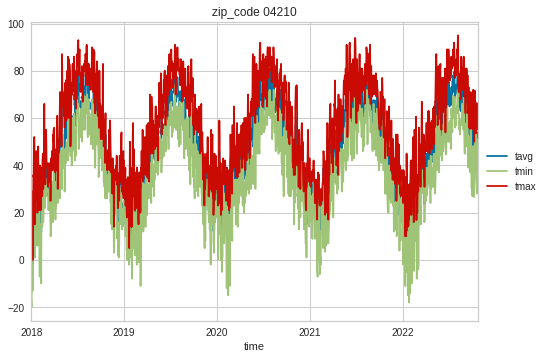

04330


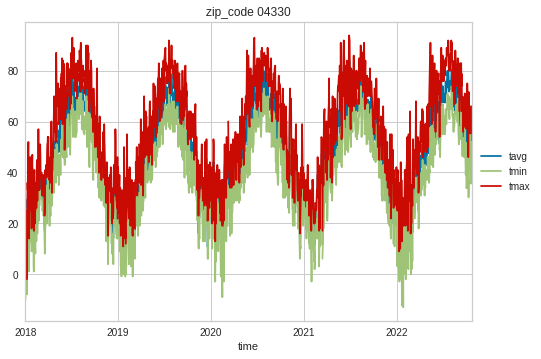

01776


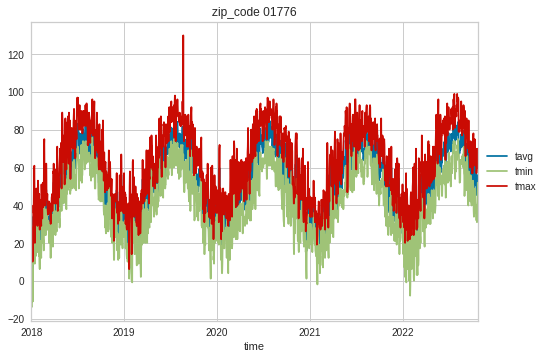

02169


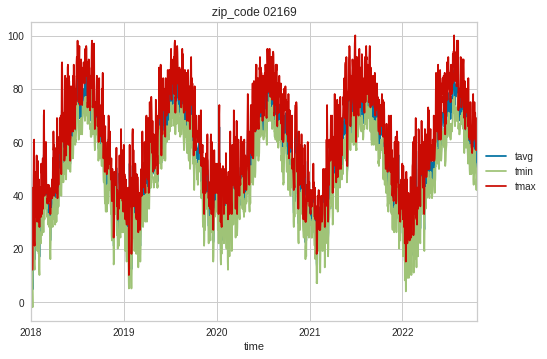

04072


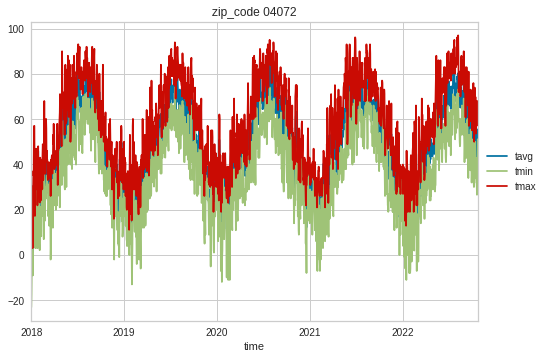

02189


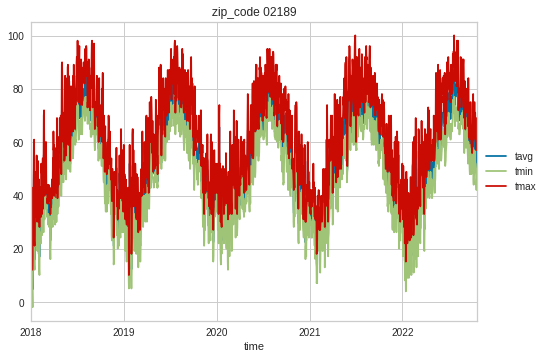

03038


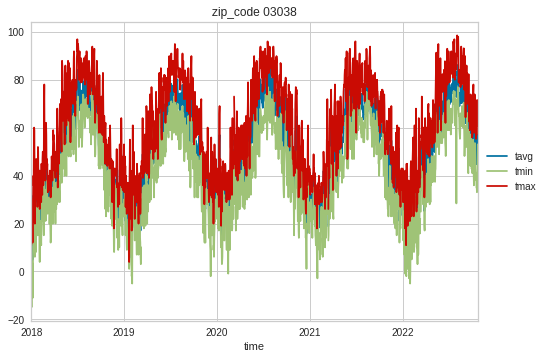

02460


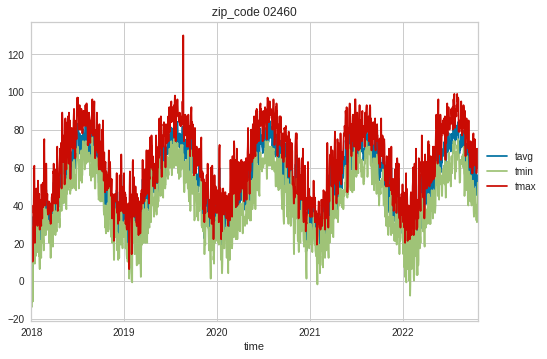

02038


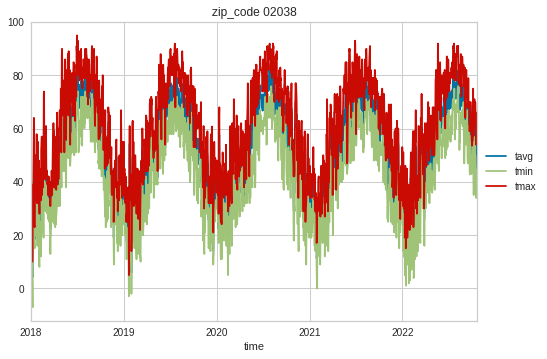

02215


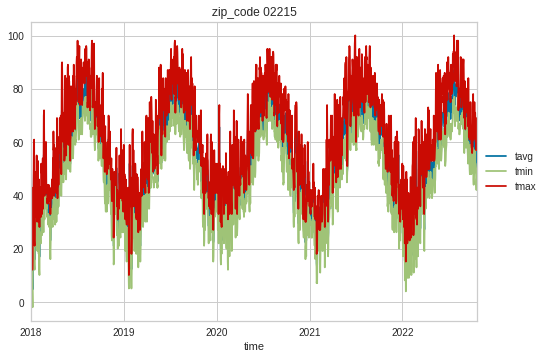

01915


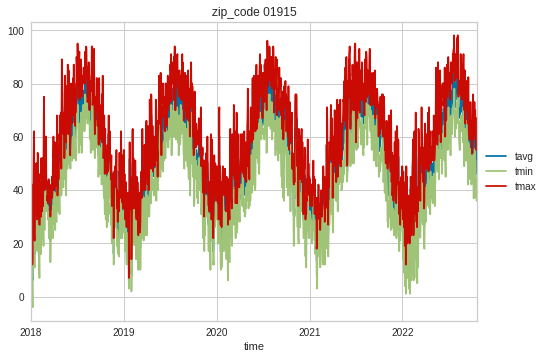

04105


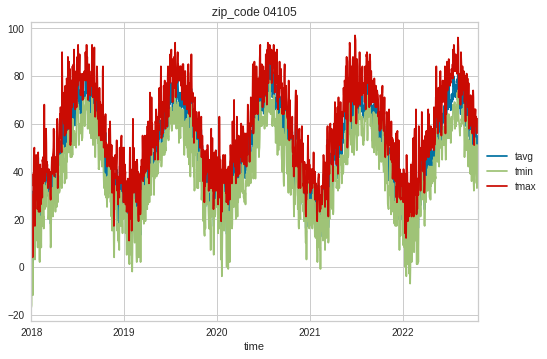

04605


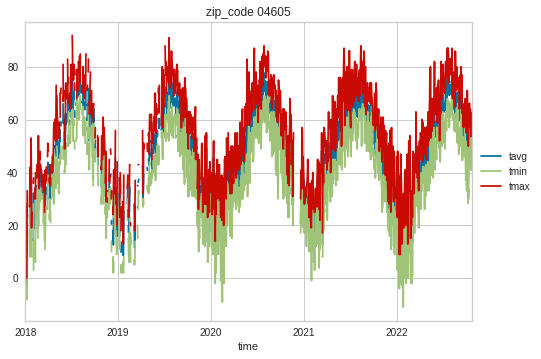

03060


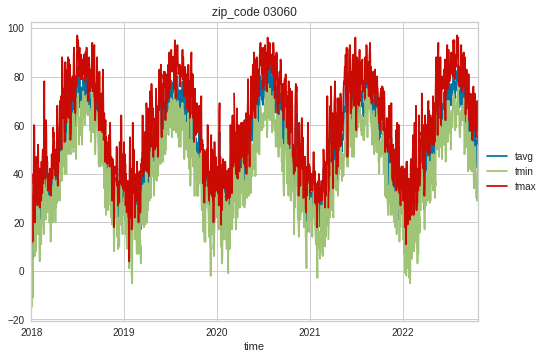

05403


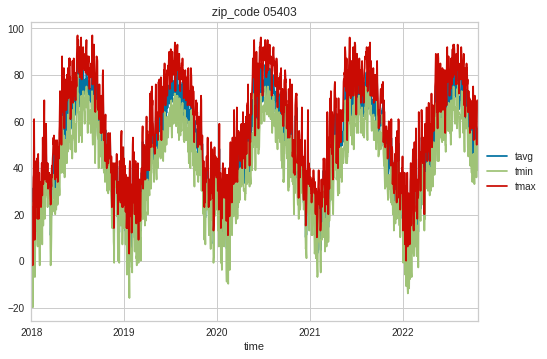

02140


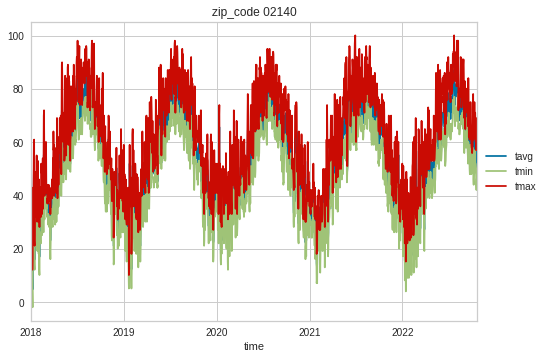

05363


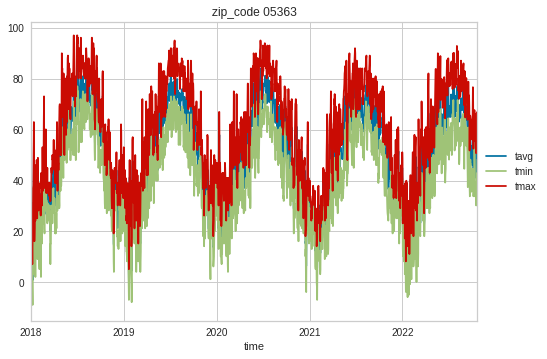

05673


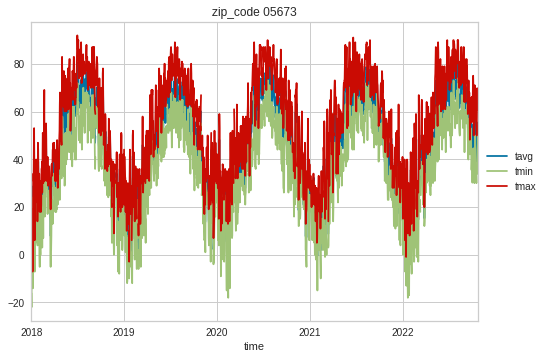

02026


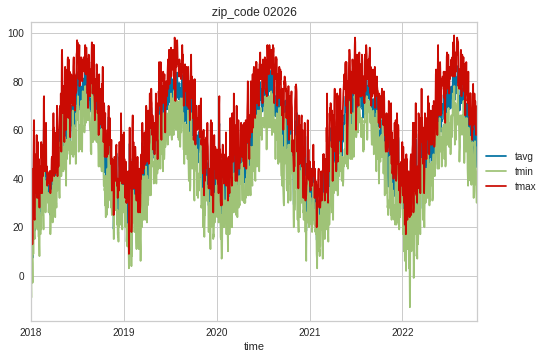

02021


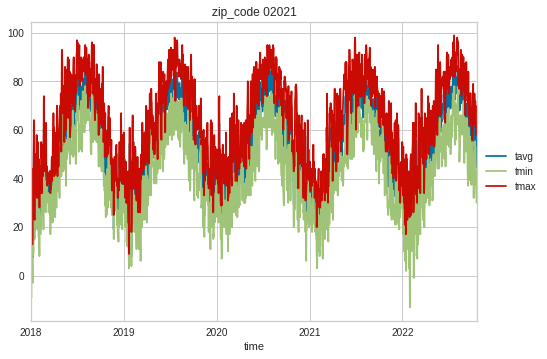

02048


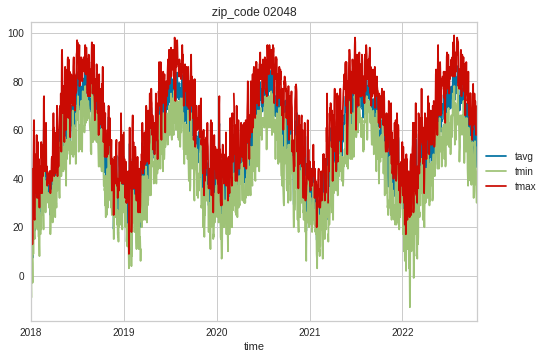

02339


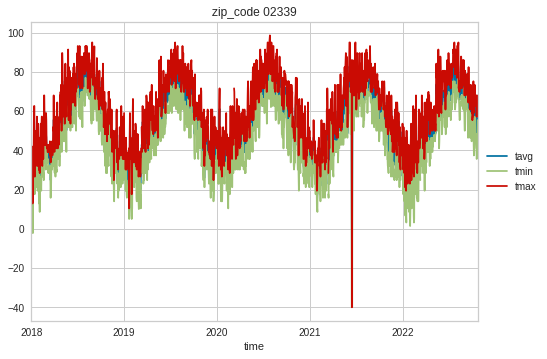

02886


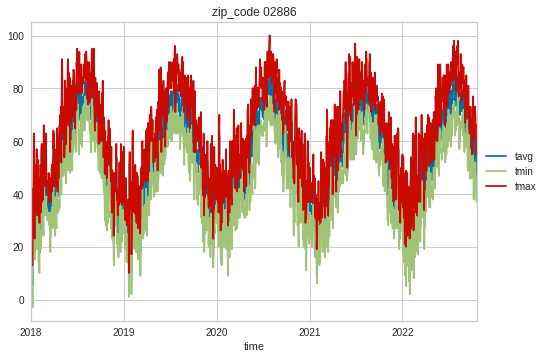

03053


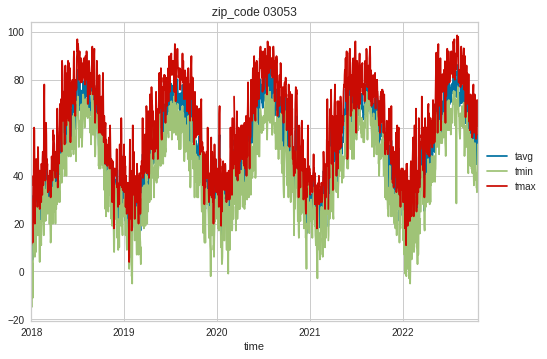

01803


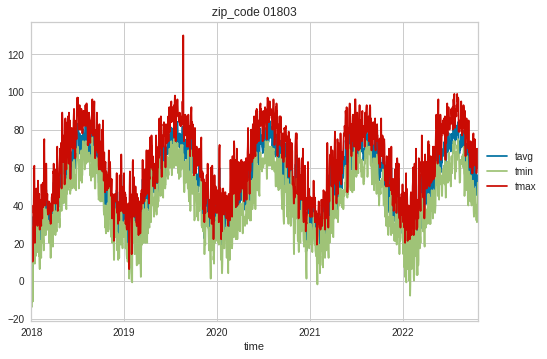

05060


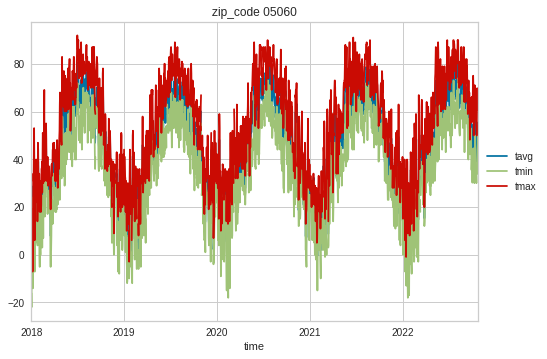

05255


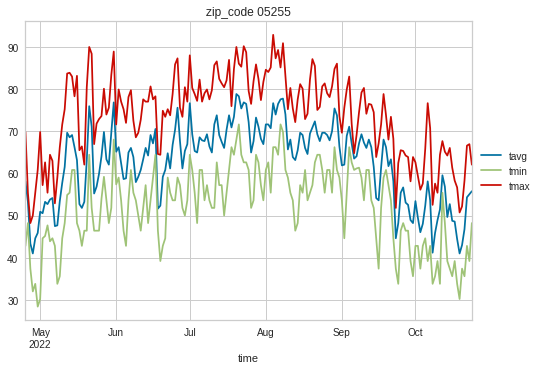

02536


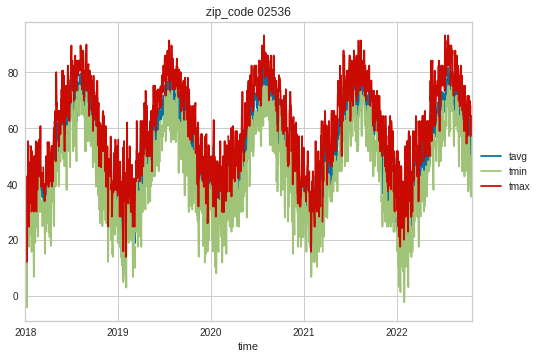

04032


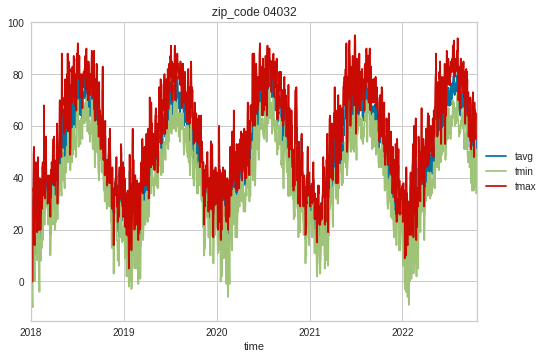

05829


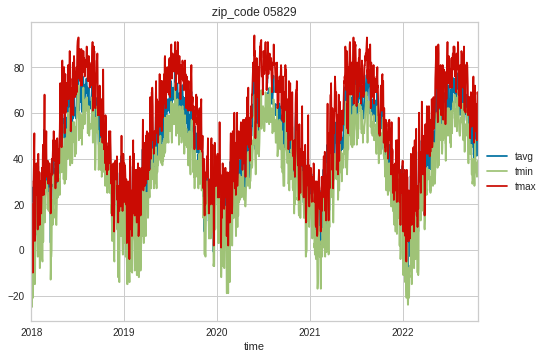

03885


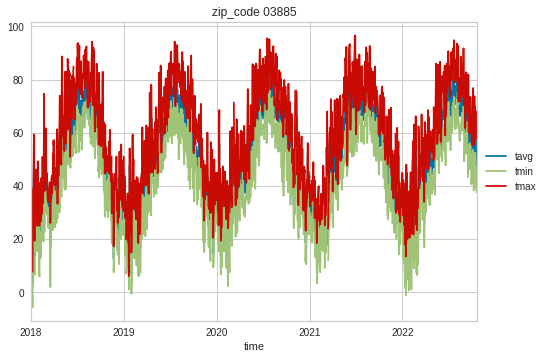

01603


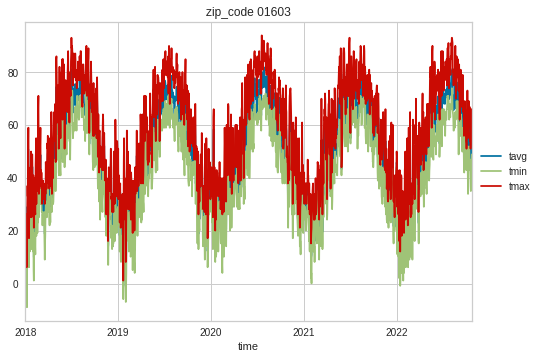

01605


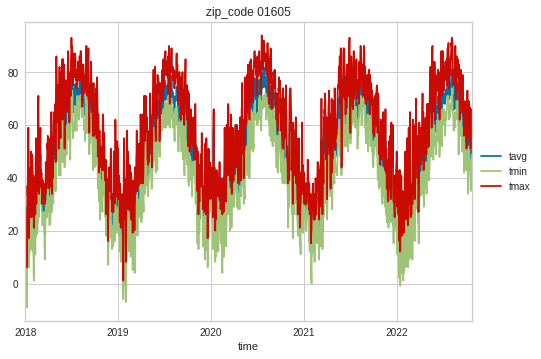

02920


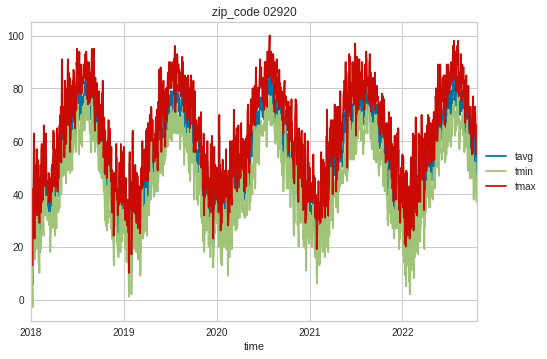

01450


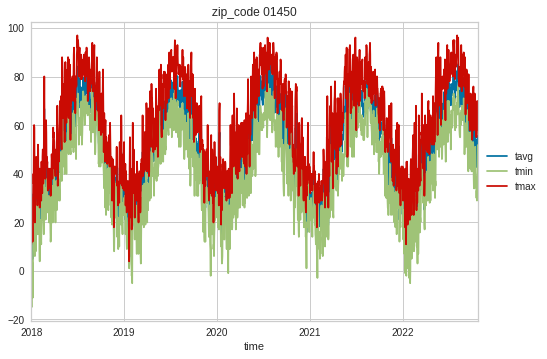

04011


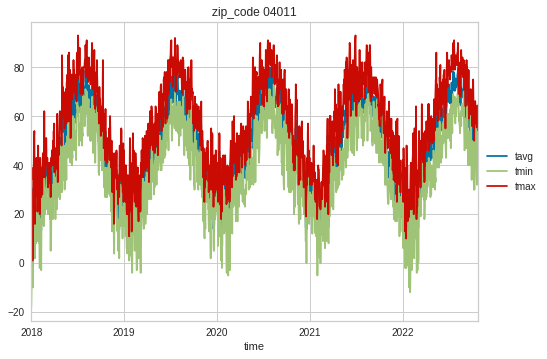

04426
02467


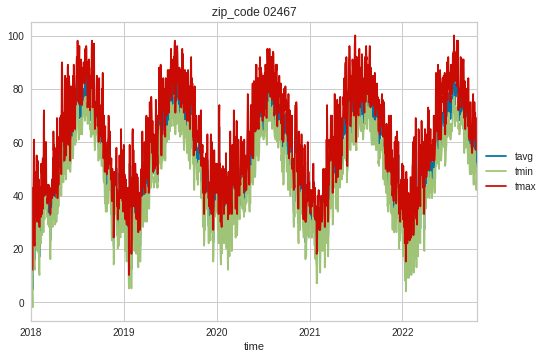

05676


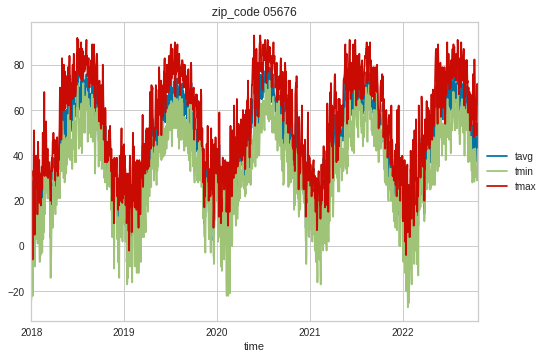

01510


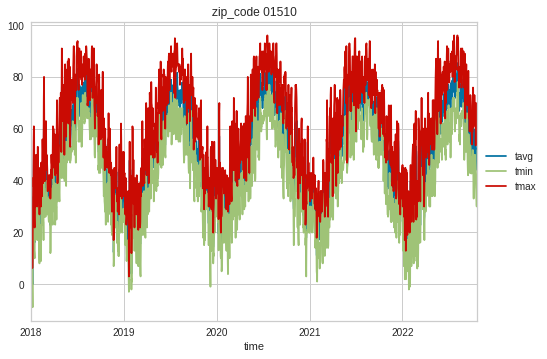

03054


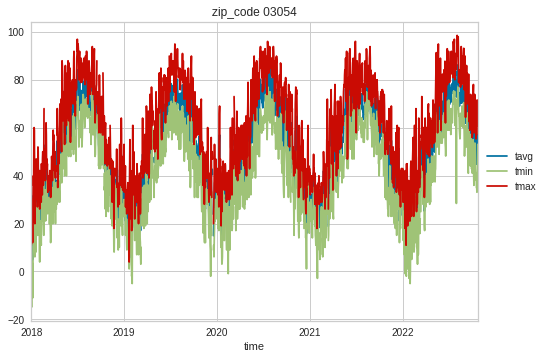

02653


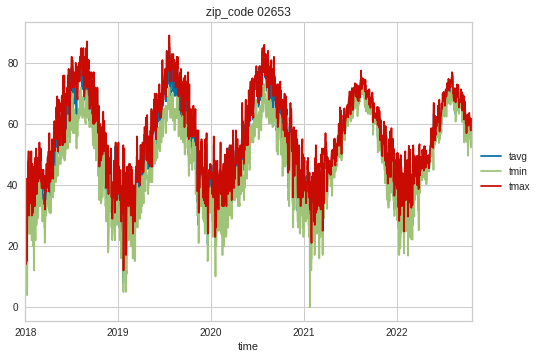

03301


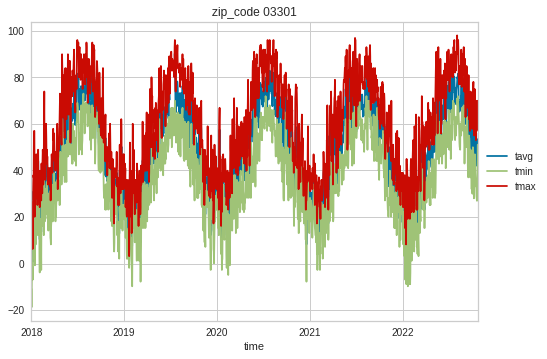

02128


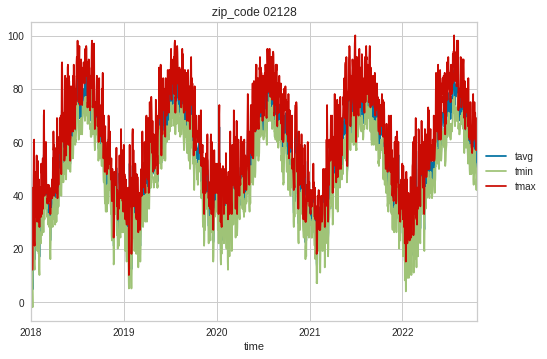

05753


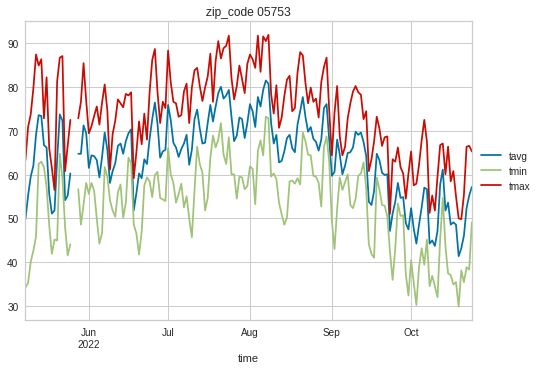

05764


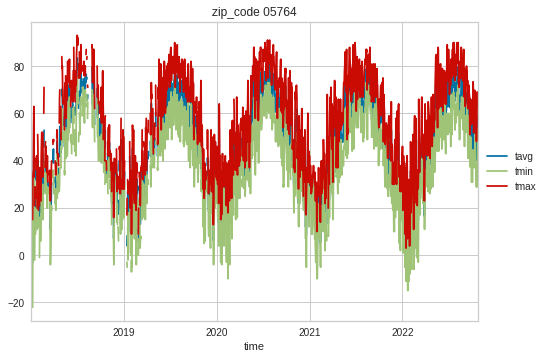

05743


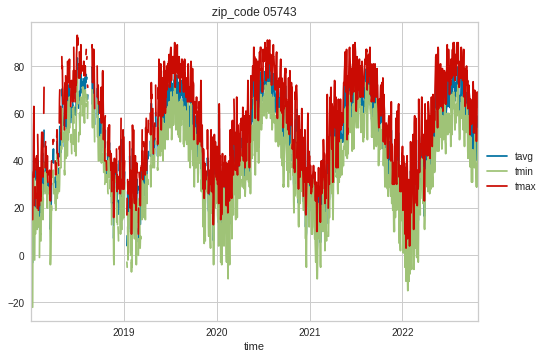

02349


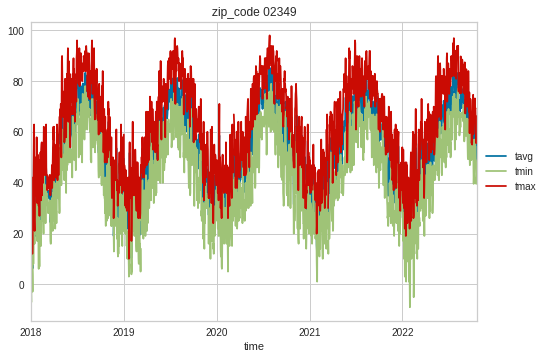

02184


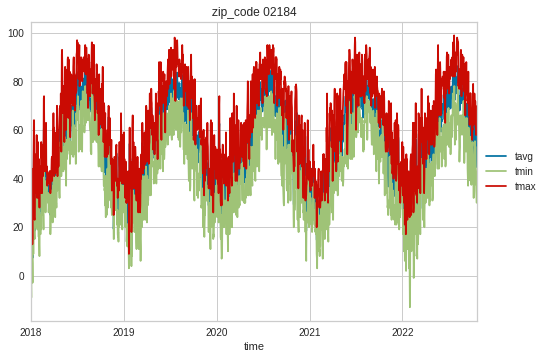

02760


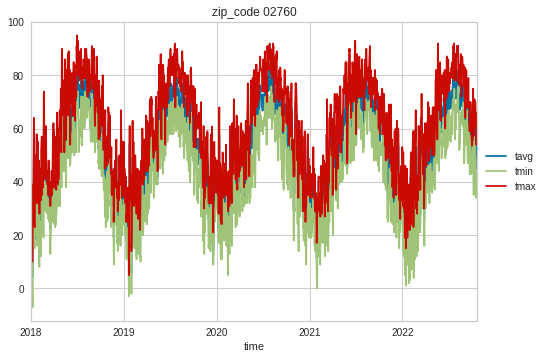

02368


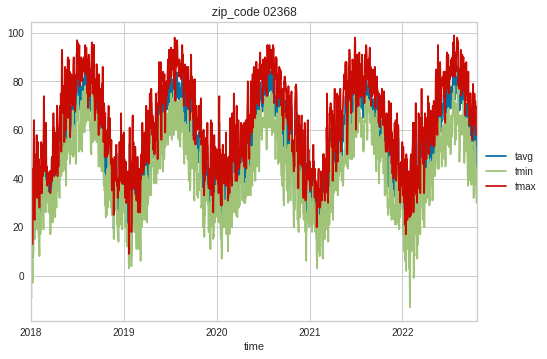

02767


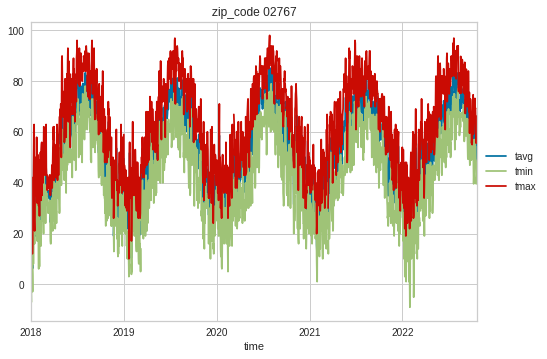

02301


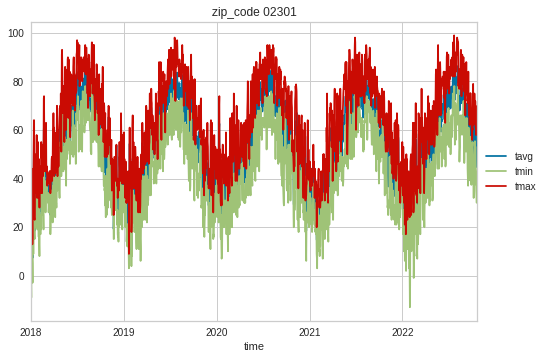

02053


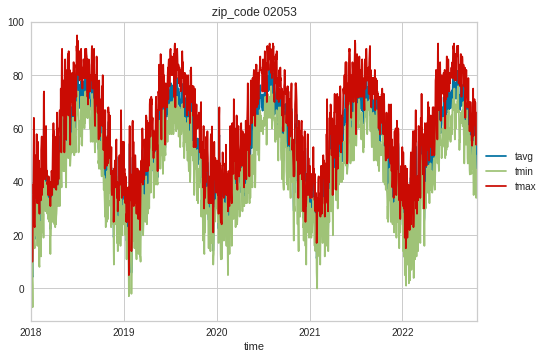

01588


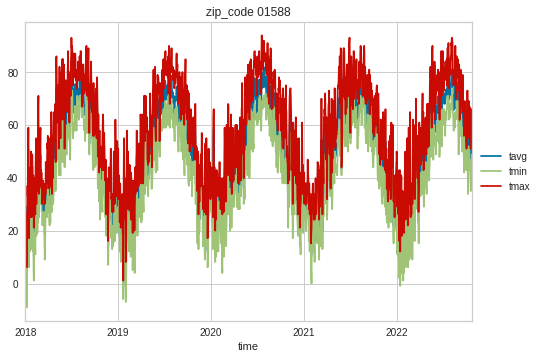

02806


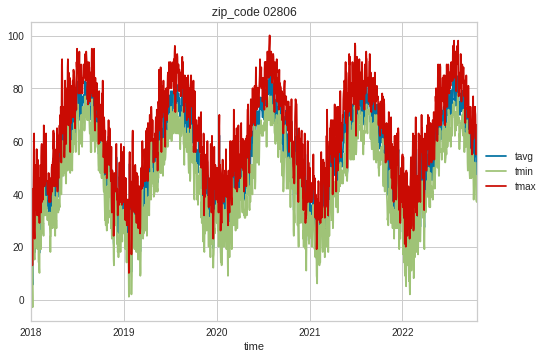

02842


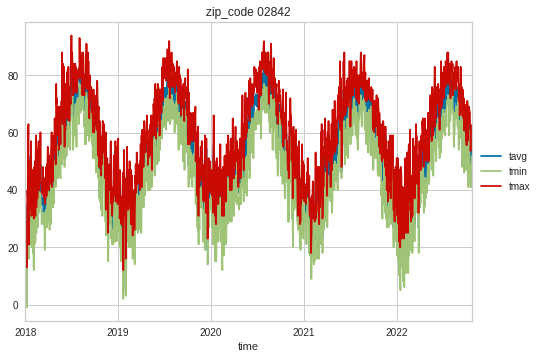

02601


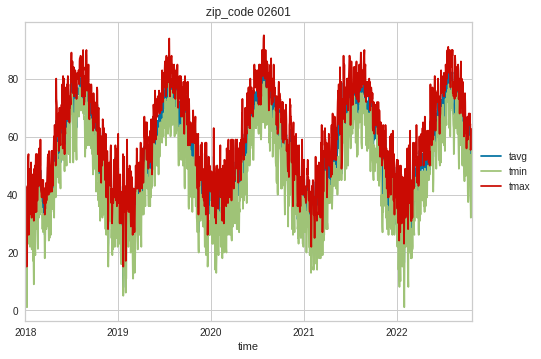

04578


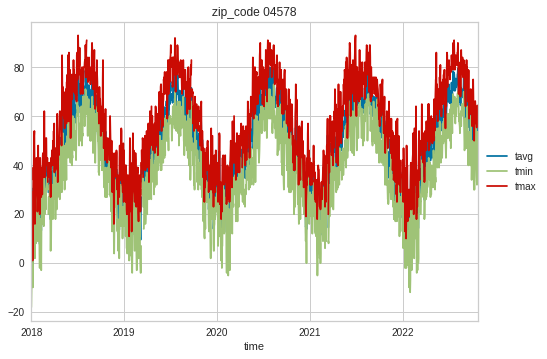

02330


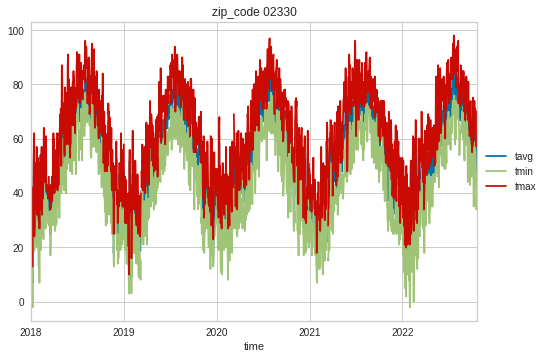

03220


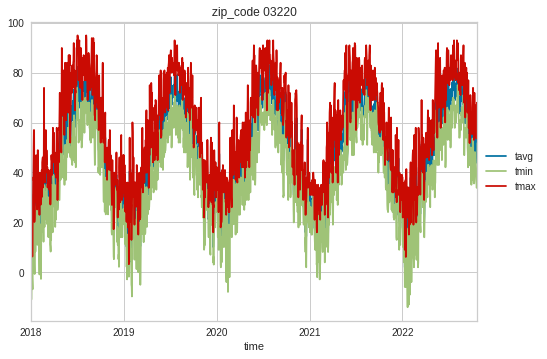

05672


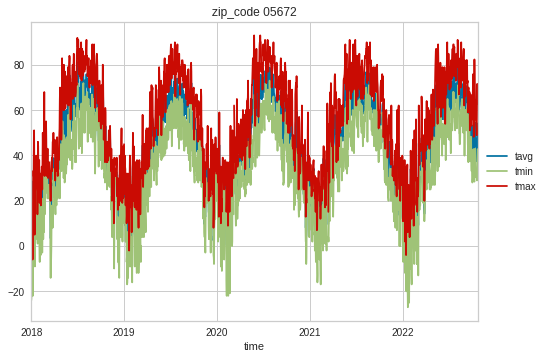

03818
02356


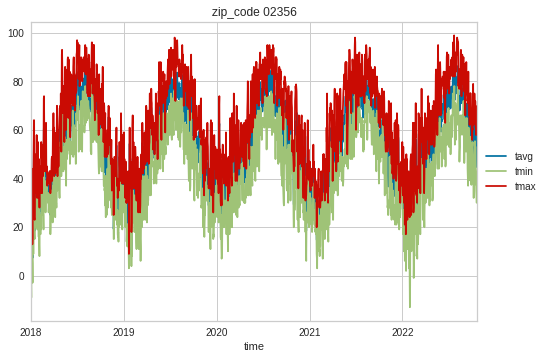

02879


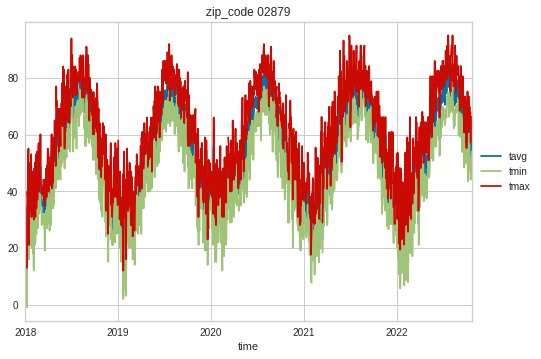

01545


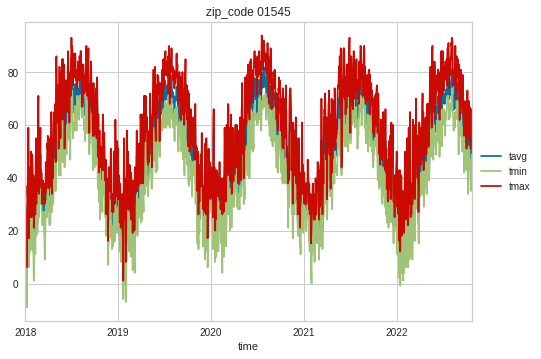

01566


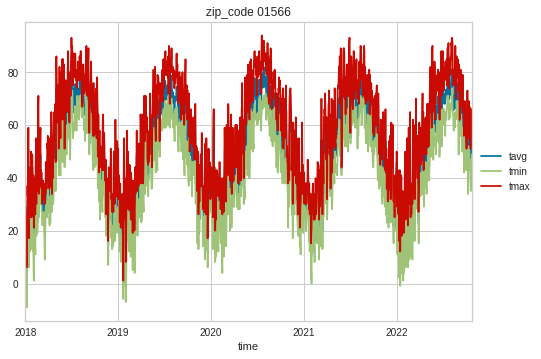

01960


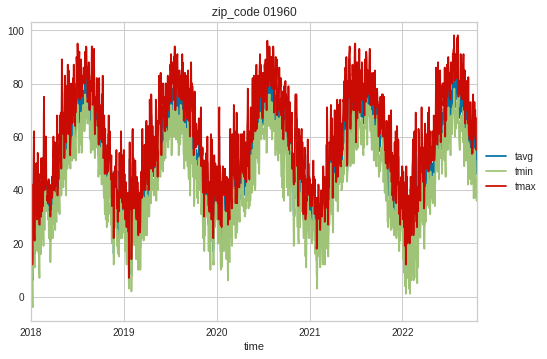

03820


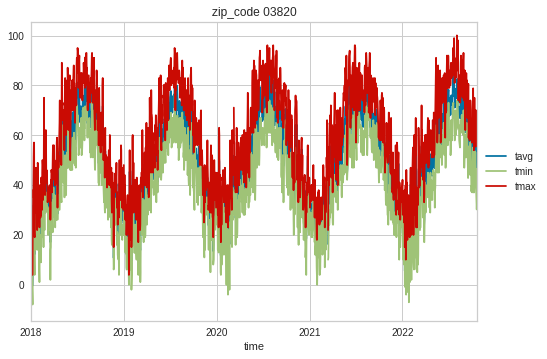

01950


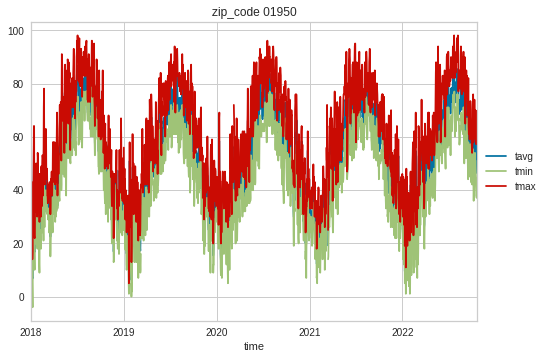

03055


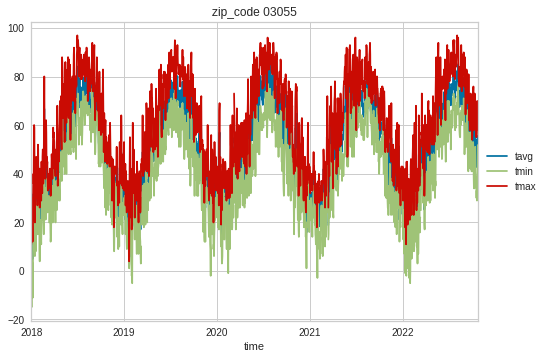

01970


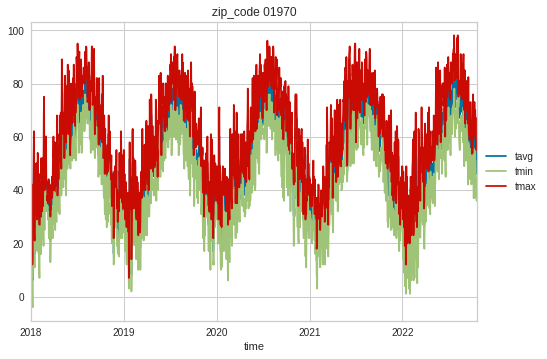

05149


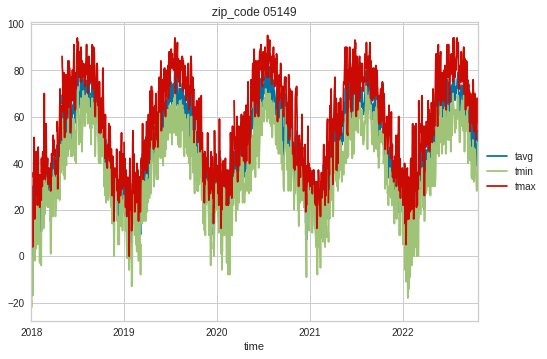

05156


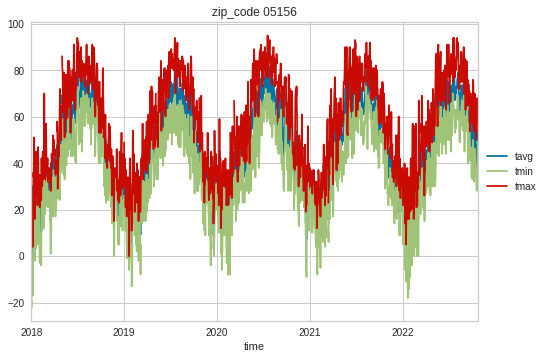

03584
05491


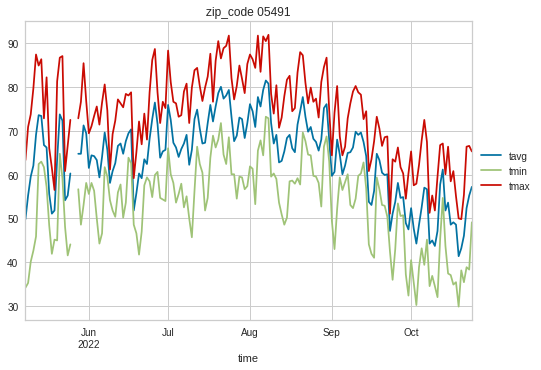

04062


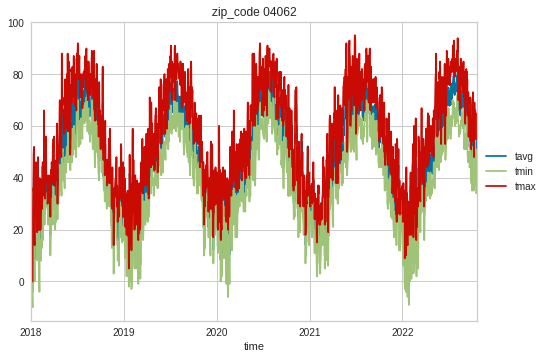

04103


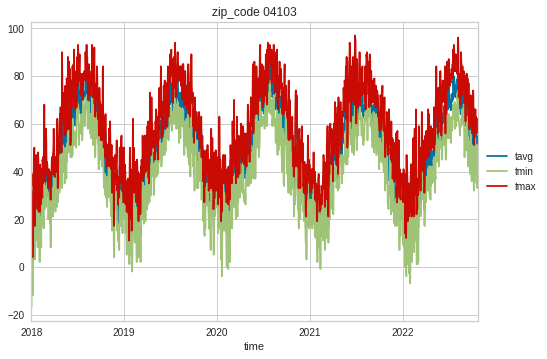

04074


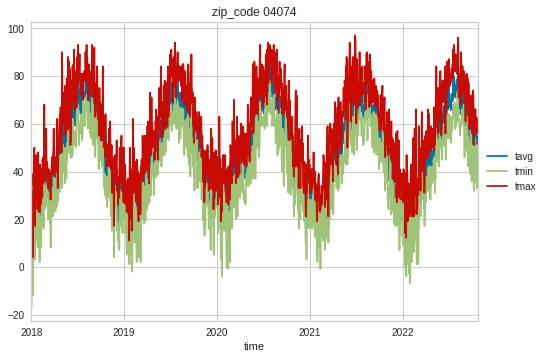

02138


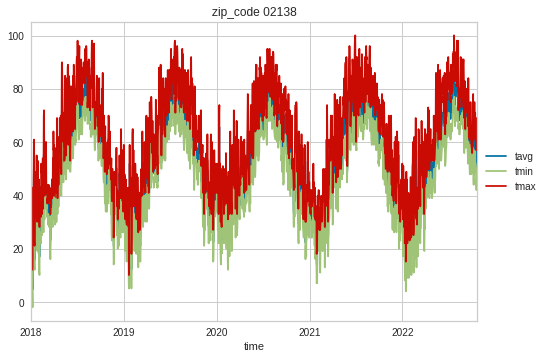

02452


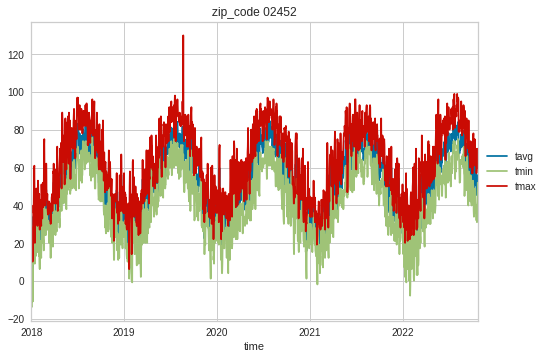

02145


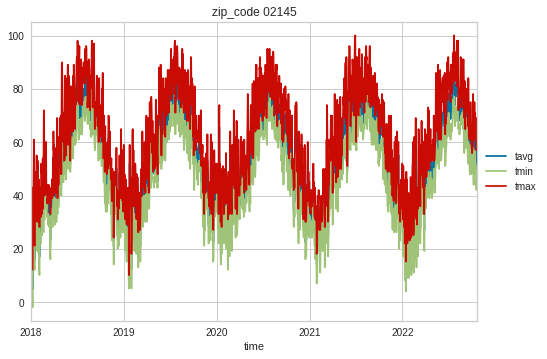

02136


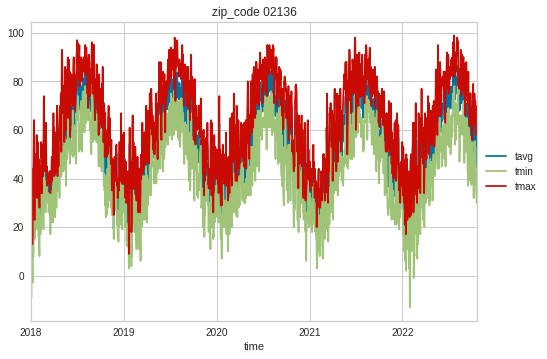

02478


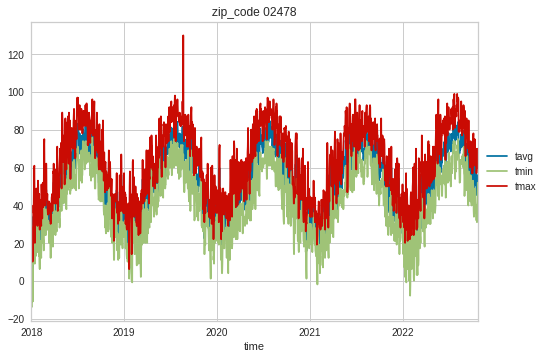

01775


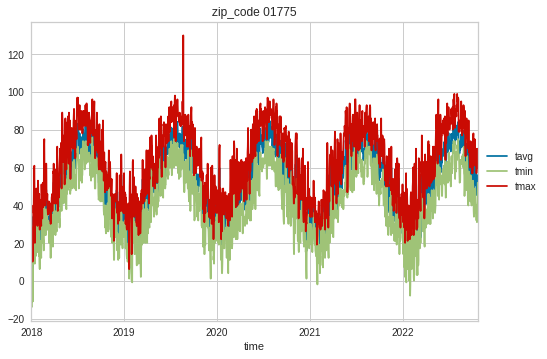

02360


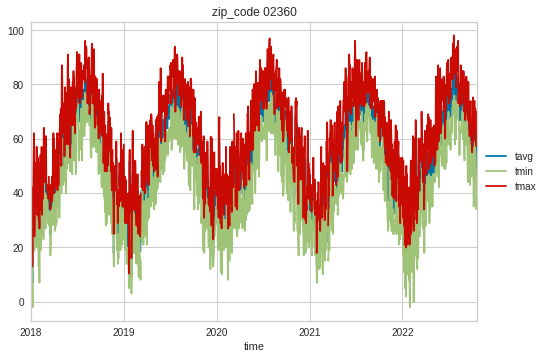

02050


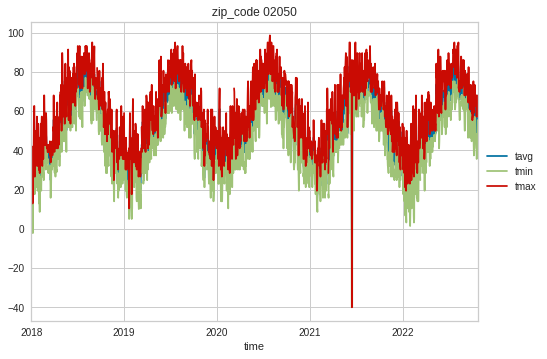

03561


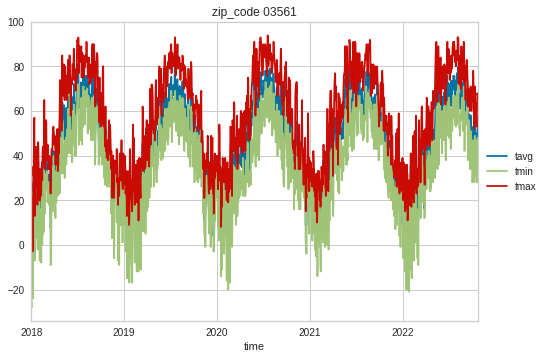

02571


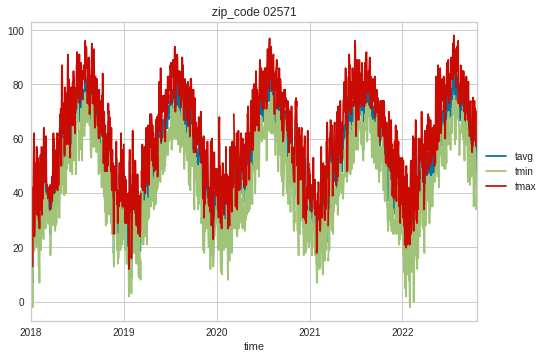

01749


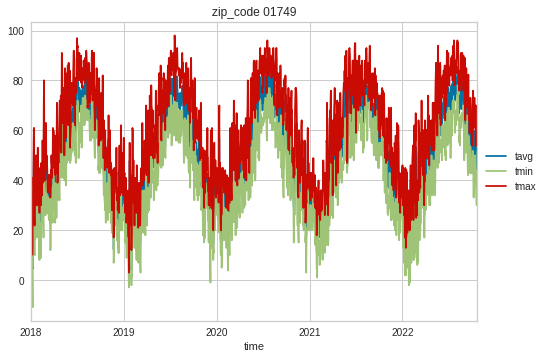

02915


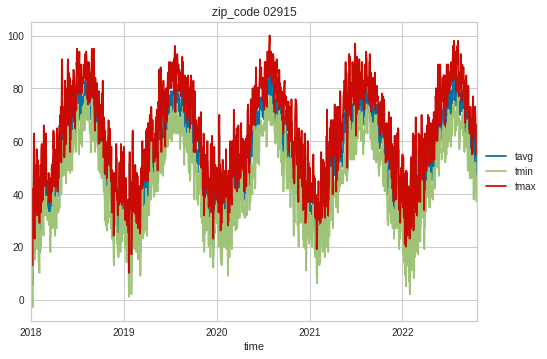

02176


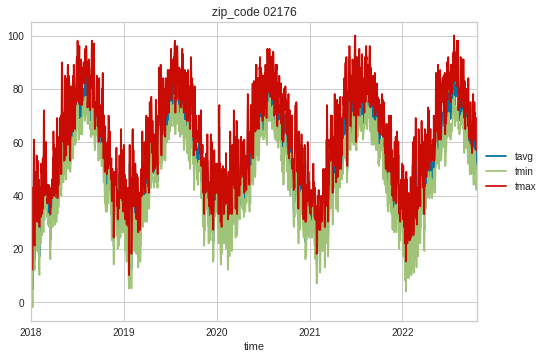

05443


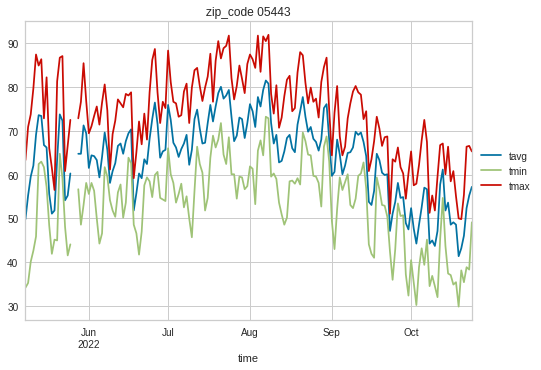

03608


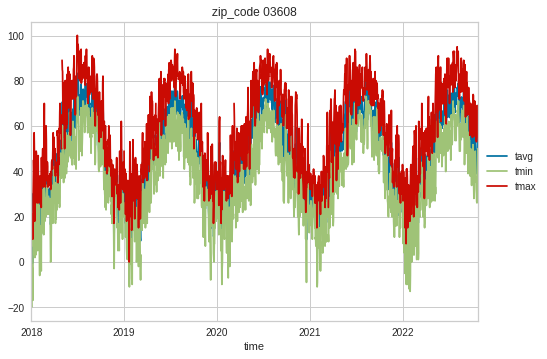

04106


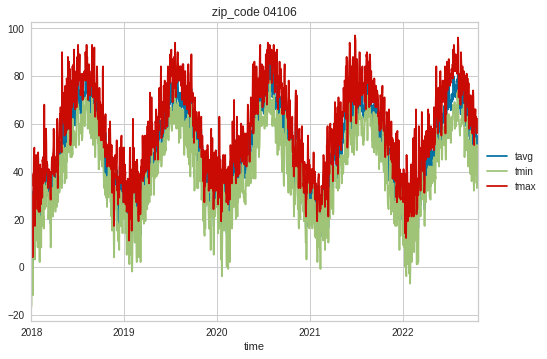

04841


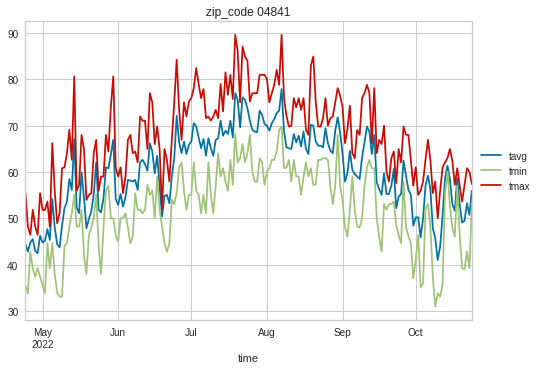

04901


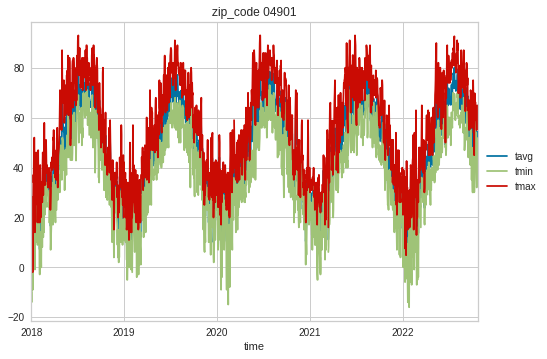

02445


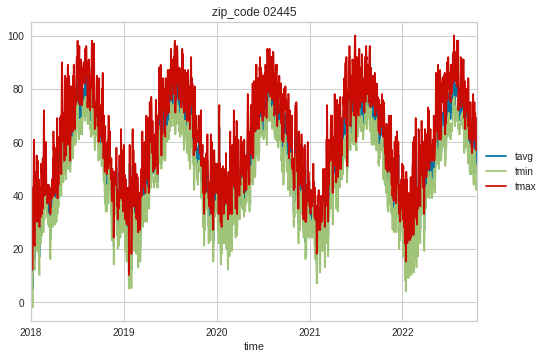

02062


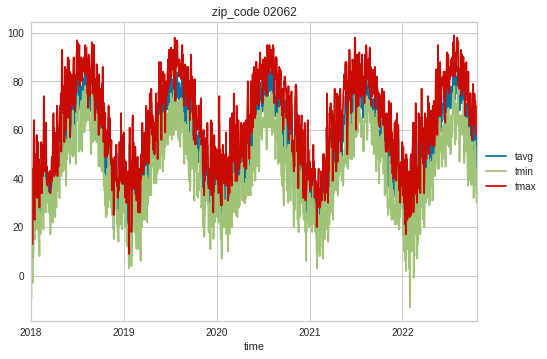

02132


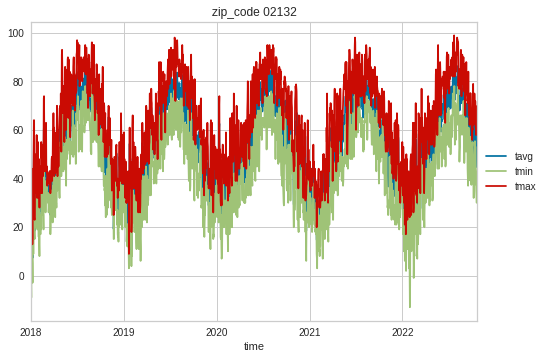

02143


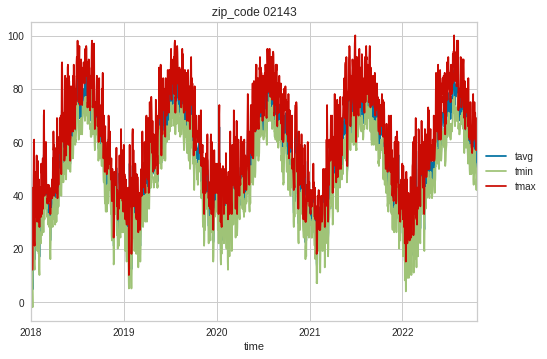

01930


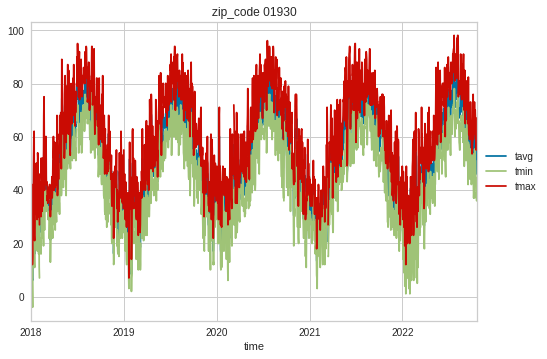

01880


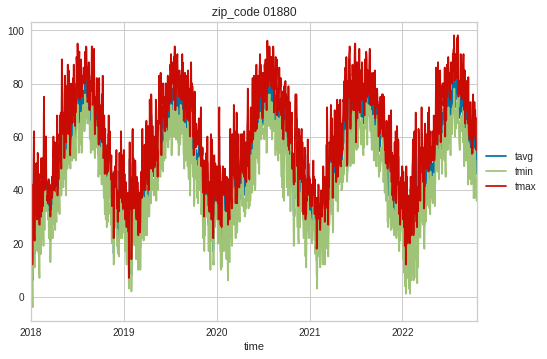

03865


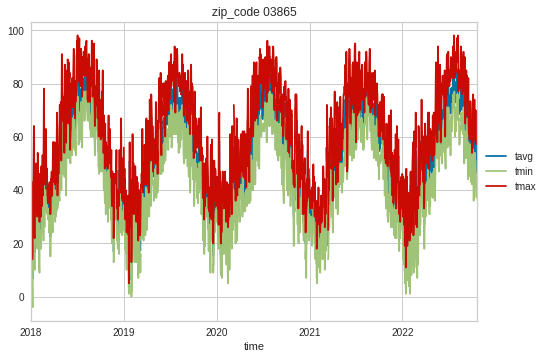

02914


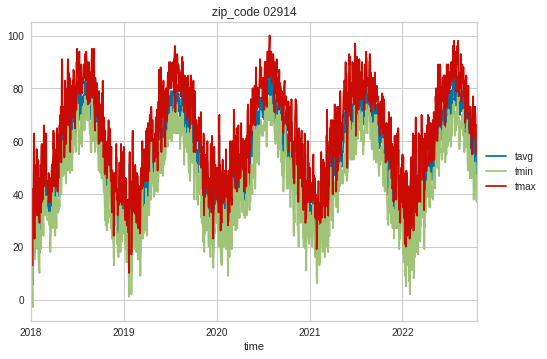

02664


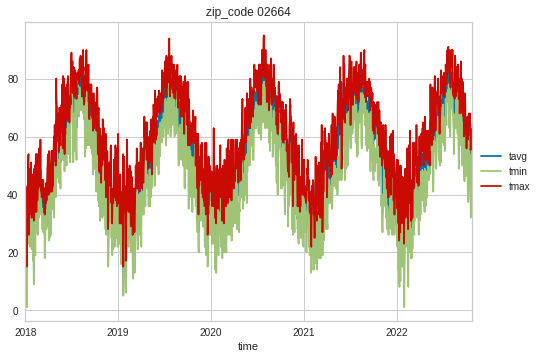

02114


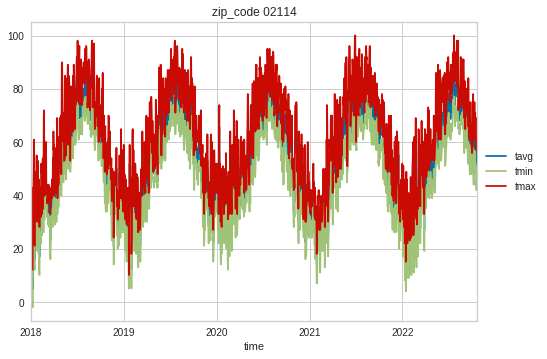

02302


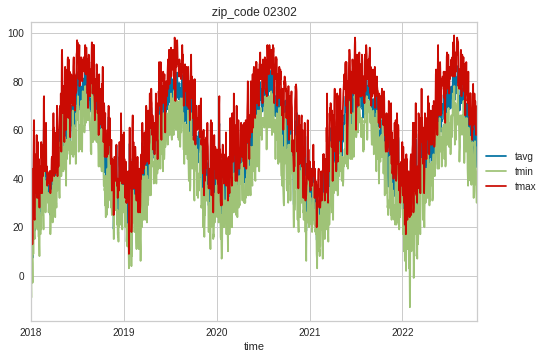

02904


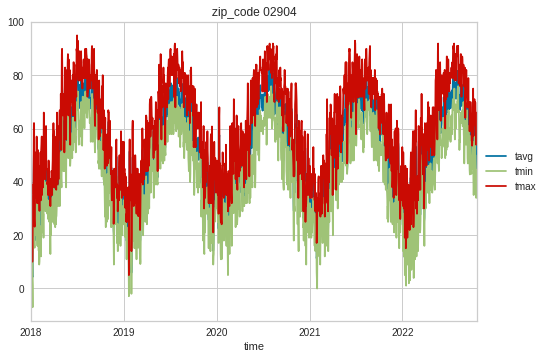

01501


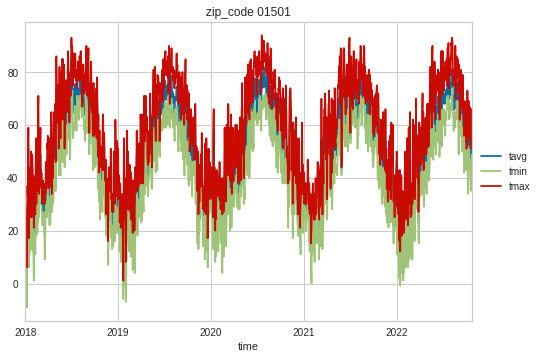

03106


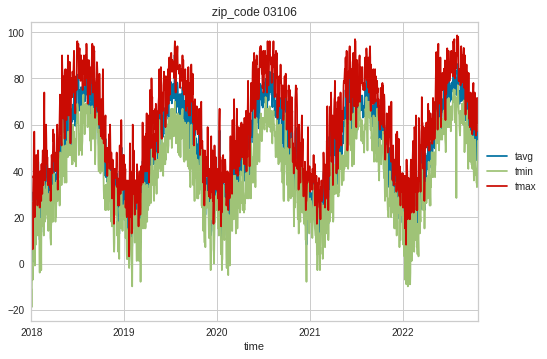

03862


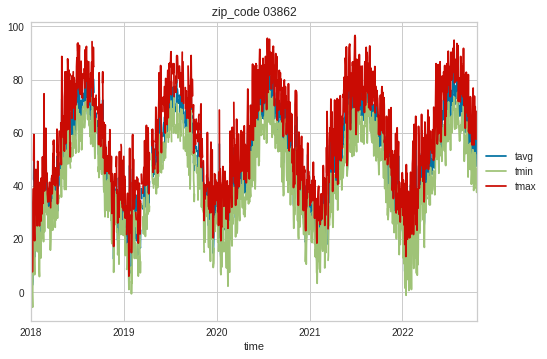

03244


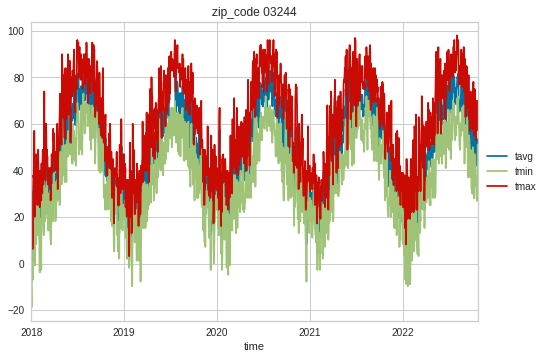

03773


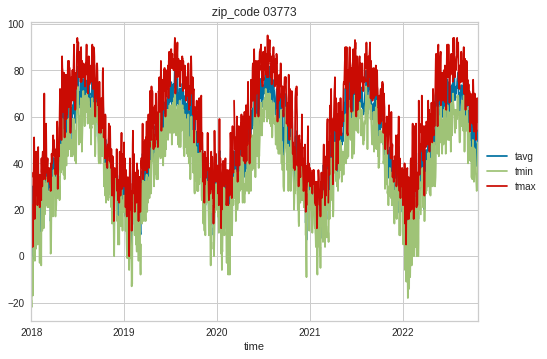

04102


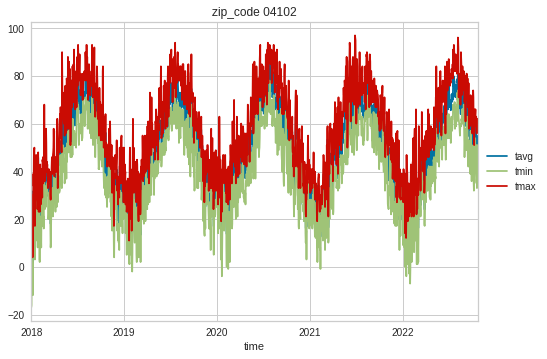

03784


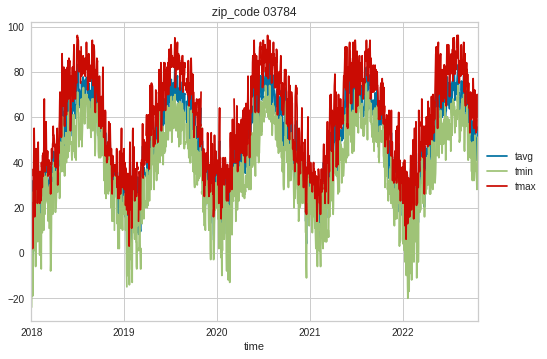

04401


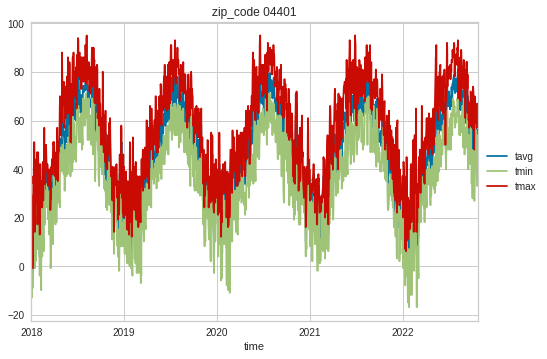

04240


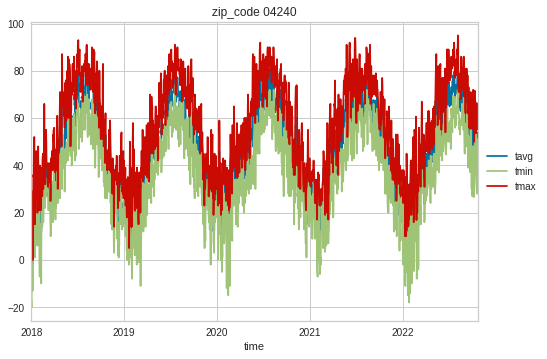

04073


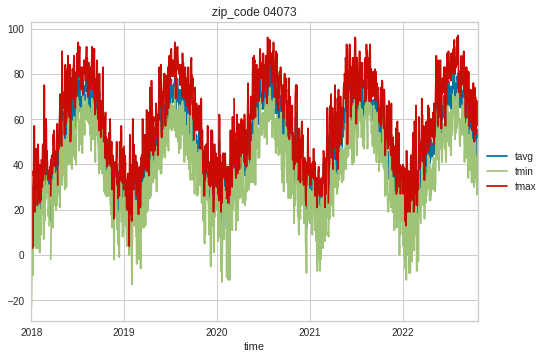

02466


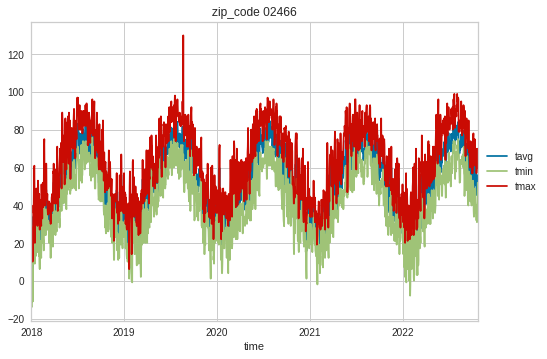

02135


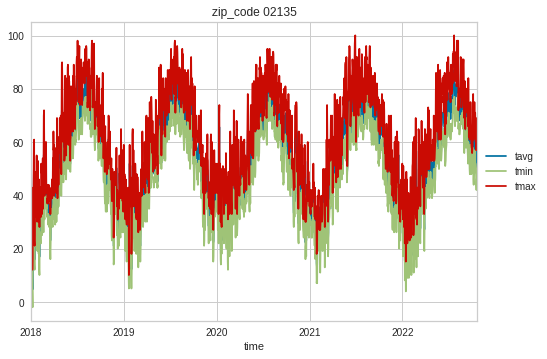

02125


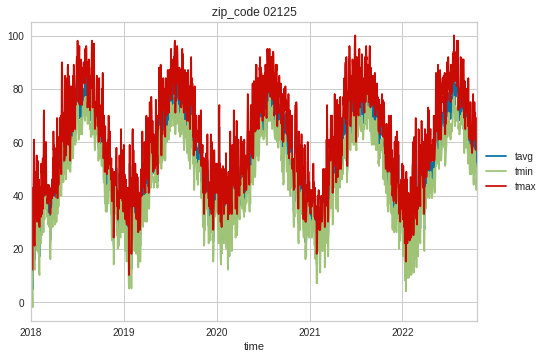

01938


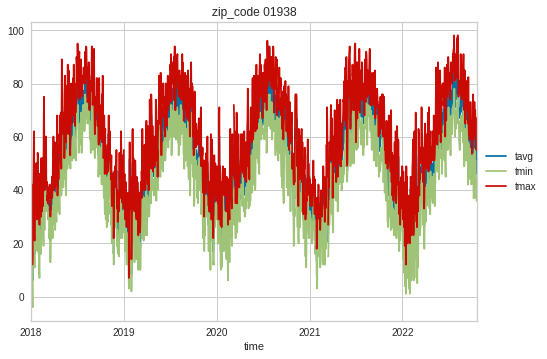

02646


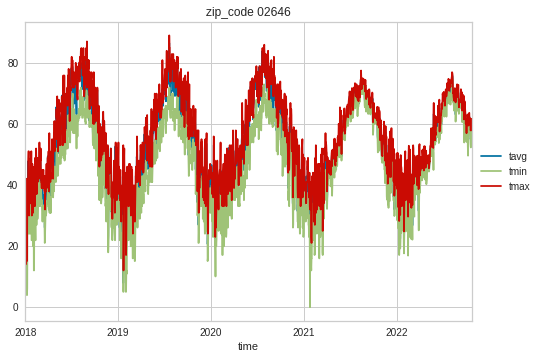

03458


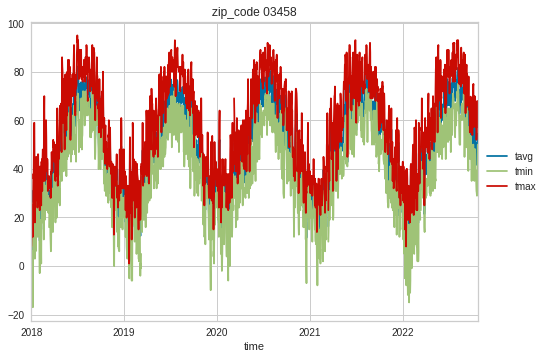

,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,lat,long,zip
time,,,,,,,,,,,,,
2018-01-01,-8.86,-16.06,-0.94,NaN,NaN,NaN,10.3,NaN,1026.9,NaN,44.2641,-72.577,05602
2018-01-02,-5.08,-22.00,15.98,NaN,NaN,NaN,6.4,NaN,NaN,NaN,44.2641,-72.577,05602
2018-01-03,13.10,6.98,19.04,NaN,NaN,NaN,10.2,NaN,1022.1,NaN,44.2641,-72.577,05602
2018-01-04,10.58,5.00,15.98,NaN,NaN,NaN,12.8,NaN,NaN,NaN,44.2641,-72.577,05602
2018-01-05,-2.02,-7.06,12.02,NaN,NaN,315.0,21.6,NaN,NaN,NaN,44.2641,-72.577,05602
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-20,42.62,30.20,53.96,0.0,NaN,209.0,12.8,NaN,1012.7,NaN,42.8856,-71.947,03458
2022-10-21,42.08,28.94,59.00,0.0,NaN,225.0,6.6,NaN,1019.8,NaN,42.8856,-71.947,03458
2022-10-22,46.76,32.00,68.00,0.0,NaN,208.0,7.3,NaN,1024.8,NaN,42.8856,-71.947,03458


In [17]:
us_zip = pgeocode.Nominatim('us')
temp_df = pd.DataFrame()
addr_weather_df = pd.DataFrame()
lat_long_list = []
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 10, 24)
err_list = []
for zip in df_zip['zipcode'].values.tolist():
    print(zip)
    lat, long = us_zip.query_postal_code(zip)[9:11][0], us_zip.query_postal_code(zip)[9:11][1]
    lat_long_list.append((lat, long))
    location = Point(lat, long)
    data = Daily(location, start, end)
    data = data.fetch()
    if len(data) == 0:
        err_list.append(zip)
        continue
    #data.reset_index(inplace = True)
    data['lat'] = lat
    data['long'] = long
    data['zip'] = zip

    data['tmin'] = data['tmin'].apply(lambda x : ((9 * x) / 5) + 32)
    data['tmax'] = data['tmax'].apply(lambda x : ((9 * x) / 5) + 32)
    data['tavg'] = data['tavg'].apply(lambda x : ((9 * x) / 5) + 32)

    addr_weather_df = addr_weather_df.append(data)
    data.plot(y=['tavg', 'tmin', 'tmax'])
    plt.title('zip_code ' + zip)
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()
    
#addr_weather_df['time'] = addr_weather_df['time'].apply(lambda x : x.strftime("%Y-%m-%d"))
addr_weather_df

# **Error List**

In [18]:
err_list

['04426', '03818', '03584']

Combining weather with weather at a zipcode.

# **Combining Weather Data along with Historical Weather Details**

In [24]:
addr_weather_df.reset_index(inplace = True)
addr_weather_df['time'] = addr_weather_df['time'].apply(lambda x : x.strftime("%Y-%m-%d"))
df_weather_consolidated = pd.merge(df_weather, addr_weather_df, how = 'inner', left_on = ['zip5', 'day_dt'], right_on = ['zip', 'time'])
df_weather_consolidated

,zip5,day_dt,high_temperature_amt,low_temperature_amt,sky_cd,precipitation_cd,temperature_cd,air_cd,uv_index_dsc,wind_speed_amt,humidity_pct,dew_point_amt,rain_fall_amt,snow_fall_amt,comfort_index_amt,precipitation_probability_pct,feed_cd,store_id,index,time,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,lat,long,zip
0,02747,2019-03-20,52.2,21.7,1,0,6,22,LOW,17.9,29,19.2,0.0,0.0,46.1,0,OTH,619,10991,2019-03-20,35.42,21.02,48.02,0.0,NaN,NaN,9.9,NaN,1028.8,NaN,41.6338,-70.9958,02747
1,02747,2019-03-21,53.1,31.7,12,66,6,30,MINIMAL,32.8,38,26.1,0.5,0.0,46.1,99,OTH,619,10992,2019-03-21,40.82,26.96,48.02,0.0,NaN,123.0,13.2,NaN,1020.7,NaN,41.6338,-70.9958,02747
2,02747,2019-03-22,45.1,38.6,18,7,6,32,MINIMAL,29.8,83,37.1,0.2,0.0,36.1,75,OTH,619,10993,2019-03-22,41.18,37.94,44.06,NaN,NaN,333.0,23.2,NaN,992.2,NaN,41.6338,-70.9958,02747
3,02747,2019-03-23,52.2,32.7,32,0,6,30,LOW,35.8,36,23.2,0.0,0.0,43.1,3,OTH,619,10994,2019-03-23,38.12,30.92,46.94,NaN,NaN,283.0,31.6,NaN,1001.4,NaN,41.6338,-70.9958,02747
4,02747,2019-03-24,59.1,25.7,3,0,7,30,LOW,32.8,23,19.2,0.0,0.0,53.7,19,OTH,619,10995,2019-03-24,40.82,26.06,53.06,0.0,NaN,NaN,16.6,NaN,1016.7,NaN,41.6338,-70.9958,02747
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2625,05673,2022-10-20,53.7,34.2,17,0,6,0,MINIMAL,29.8,50,32.7,0.0,0.0,45.2,12,OTH,326,61525,2022-10-20,43.70,37.40,50.00,0.0,NaN,197.0,11.8,NaN,1011.7,NaN,44.1889,-72.8283,05673
2626,05673,2022-10-21,55.3,29.9,3,0,6,0,MINIMAL,17.9,43,31.4,0.0,0.0,50.1,1,OTH,326,61526,2022-10-21,46.22,35.60,57.92,0.0,NaN,178.0,10.2,NaN,1019.2,NaN,44.1889,-72.8283,05673
2627,05673,2022-10-22,62.3,35.9,1,0,8,20,MINIMAL,14.9,46,39.4,0.0,0.0,60.4,2,OTH,326,61527,2022-10-22,51.44,33.98,69.80,0.0,NaN,158.0,9.5,NaN,1023.8,NaN,44.1889,-72.8283,05673
2628,05673,2022-10-23,62.1,35.9,3,65,6,20,MINIMAL,3.0,45,40.4,0.1,0.0,62.3,69,OTH,326,61528,2022-10-23,51.26,37.04,68.00,0.0,NaN,30.0,3.0,NaN,1028.7,NaN,44.1889,-72.8283,05673


In [26]:
df_weather_consolidated['avg_temperature_amt'] = (df_weather_consolidated['high_temperature_amt'] + df_weather_consolidated['low_temperature_amt'] )/ 2
df_weather_consolidated['historic_tmin'] = df_weather_consolidated['tmin']
df_weather_consolidated['historic_tmax'] = df_weather_consolidated['tmax']
df_weather_consolidated['historic_tavg'] = df_weather_consolidated['tavg']

# **Combining Weather and Holiday Data Together**

In [27]:
df_weather_consolidated = pd.merge(df_weather_consolidated, df_holiday_combined[df_holiday_combined.level == 'FE'], how = 'left', left_on = 'day_dt', right_on = 'date')
df_weather_consolidated.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'sky_cd', 'precipitation_cd', 'temperature_cd', 'air_cd',
       'uv_index_dsc', 'wind_speed_amt', 'humidity_pct', 'dew_point_amt',
       'rain_fall_amt', 'snow_fall_amt', 'comfort_index_amt',
       'precipitation_probability_pct', 'feed_cd', 'store_id', 'index', 'time',
       'tavg', 'tmin', 'tmax', 'prcp', 'snow', 'wdir', 'wspd', 'wpgt', 'pres',
       'tsun', 'lat', 'long', 'zip', 'avg_temperature_amt', 'historic_tmin',
       'historic_tmax', 'historic_tavg', 'level', 'year', 'date',
       'holiday_name'],
      dtype='object')

In [28]:
df_weather_consolidated.iloc[0]

zip5                                  02747
day_dt                           2019-03-20
high_temperature_amt                   52.2
low_temperature_amt                    21.7
sky_cd                                    1
precipitation_cd                          0
temperature_cd                            6
air_cd                                   22
uv_index_dsc                            LOW
wind_speed_amt                         17.9
humidity_pct                             29
dew_point_amt                          19.2
rain_fall_amt                           0.0
snow_fall_amt                           0.0
comfort_index_amt                      46.1
precipitation_probability_pct             0
feed_cd                                 OTH
store_id                                619
index                                 10991
time                             2019-03-20
tavg                                  35.42
tmin                                  21.02
tmax                            

In [29]:
'''
df_weather_refined = df_weather_consolidated[['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt', 'avg_temperature_amt',
                                              'historic_tmin', 'historic_tmax', 'historic_tavg', 'date', 'store_id']]
'''
df_weather_consolidated['holiday_ind'] = np.where(df_weather_consolidated['date'].isna(),0,1)
df_weather_refined = df_weather_consolidated[['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt', 'avg_temperature_amt',
                                              'historic_tmin', 'historic_tmax', 'historic_tavg', 'holiday_ind', 'store_id']]

In [30]:
df_weather_refined.iloc[0]

zip5                         02747
day_dt                  2019-03-20
high_temperature_amt          52.2
low_temperature_amt           21.7
avg_temperature_amt          36.95
historic_tmin                21.02
historic_tmax                48.02
historic_tavg                35.42
holiday_ind                      0
store_id                       619
Name: 0, dtype: object

In [31]:
df_weather_refined[df_weather_refined.zip5.isin(['02747','05673','05764'])]

,zip5,day_dt,high_temperature_amt,low_temperature_amt,avg_temperature_amt,historic_tmin,historic_tmax,historic_tavg,holiday_ind,store_id
0,02747,2019-03-20,52.2,21.7,36.95,21.02,48.02,35.42,0,619
1,02747,2019-03-21,53.1,31.7,42.40,26.96,48.02,40.82,0,619
2,02747,2019-03-22,45.1,38.6,41.85,37.94,44.06,41.18,0,619
3,02747,2019-03-23,52.2,32.7,42.45,30.92,46.94,38.12,0,619
4,02747,2019-03-24,59.1,25.7,42.40,26.06,53.06,40.82,0,619
...,...,...,...,...,...,...,...,...,...,...
2625,05673,2022-10-20,53.7,34.2,43.95,37.40,50.00,43.70,0,326
2626,05673,2022-10-21,55.3,29.9,42.60,35.60,57.92,46.22,0,326
2627,05673,2022-10-22,62.3,35.9,49.10,33.98,69.80,51.44,0,326
2628,05673,2022-10-23,62.1,35.9,49.00,37.04,68.00,51.26,0,326


In [32]:
df_weather_refined.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id'],
      dtype='object')

# **Get Transaction Data at Store-CSC-Day Level**

In [33]:
#df_txn_1 = pd.read_csv('result_txn_1.csv')
#df_txn_2 = pd.read_csv('result_txn_2.csv')
#df_txn_1.columns = [col.lower() for col in df_txn_1.columns]
#df_txn_2.columns = [col.lower() for col in df_txn_2.columns]
df_txn = pd.read_csv('result_txn_619_326_3087.csv')
df_txn.columns = [col.lower() for col in df_txn.columns]
df_txn['eff_price'] = np.where((df_txn['promo_unit_prc'] == 0) | (df_txn['promo_unit_prc'].isna()), df_txn['reg_unit_prc'], df_txn['promo_unit_prc'])
df_txn['promo_depth'] = df_txn['eff_price'] / df_txn['reg_unit_prc']
df_txn.head()

,txn_dte,consumer_selling_cd,smic_group_cd,store_id,reg_unit_prc,promo_unit_prc,total_gross_amt,total_item_qty,total_mkdn_qty,total_mkdn_amt,total_net_amt,total_mkdn_wod_alloc_amt,total_mkdn_pod_alloc_amt,eff_price,promo_depth
0,2020-01-01,146385,25,619,1.99,1.79,9.95,5,5,-1.00,8.95,0.0,0.0,1.79,0.89949749
1,2020-01-01,146393,25,619,1.99,NaN,15.92,8,8,-2.58,13.34,0.0,0.0,1.99,1.00000000
2,2020-01-01,146399,25,619,1.99,NaN,37.81,19,21,-6.45,31.36,0.0,0.0,1.99,1.00000000
3,2020-01-01,146408,25,619,2.69,NaN,5.38,2,0,0.00,5.38,0.0,0.0,2.69,1.00000000
4,2020-01-01,146408,25,3087,2.69,NaN,13.45,5,0,0.00,13.45,0.0,0.0,2.69,1.00000000


In [34]:
df_txn[df_txn['promo_depth'] < 1].head()

,txn_dte,consumer_selling_cd,smic_group_cd,store_id,reg_unit_prc,promo_unit_prc,total_gross_amt,total_item_qty,total_mkdn_qty,total_mkdn_amt,total_net_amt,total_mkdn_wod_alloc_amt,total_mkdn_pod_alloc_amt,eff_price,promo_depth
0,2020-01-01,146385,25,619,1.99,1.79,9.95,5,5,-1.0,8.95,0.0,0.0,1.79,0.89949749
15,2020-01-01,322058,11,619,3.99,2.99,10.47,3,3,-1.5,8.97,0.0,0.0,2.99,0.74937343
17,2020-01-01,322058,11,3087,3.99,2.99,6.98,2,2,-1.0,5.98,0.0,0.0,2.99,0.74937343
18,2020-01-01,322060,11,326,4.99,4.69,4.99,1,1,-0.3,4.69,0.0,0.0,4.69,0.93987976
29,2020-01-01,460913,11,326,4.99,4.69,4.99,1,1,-0.3,4.69,0.0,0.0,4.69,0.93987976


In [35]:
len(df_txn[['consumer_selling_cd']].drop_duplicates())

33

In [36]:
df_weather_refined['day_dt'].min(), df_txn['txn_dte'].min()

('2019-03-20', '2020-01-01')

In [37]:
df_txn.groupby(['store_id','consumer_selling_cd']).agg({'txn_dte': np.min})

txn_dte
store_id consumer_selling_cd            
326      146399               2020-01-03
         146408               2020-01-03
         146629               2020-01-02
         146761               2020-01-03
         146835               2020-01-03
         147065               2020-01-01
         322059               2020-01-01
         322060               2020-01-01
         322082               2020-01-01
         322087               2020-01-02
         322325               2020-01-03
         322389               2020-01-02
         322390               2020-01-01
         322455               2020-01-02
         410691               2020-01-01
         460651               2020-01-01
         460913               2020-01-01
         461103               2020-12-18
         466564               2020-01-01
         778229               2020-01-01
619      146385               2020-01-01
         146393               2020-01-01
         146399               2020-01-01
         146408               2020-01-01
         146453               2020-01-01
         146629               2020-01-01
         146675               2020-01-01
         146761               2020-01-02
         146835               2020-01-01
         322045               2020-01-01
         322058               2020-01-01
         322059               2020-01-01
         322060               2020-01-01
         322082               2020-01-02
         322087               2020-01-01
         322554               2020-01-01
         322557               2020-01-03
         322625               2020-01-02
         413364               2020-07-12
         460913               2020-01-02
3087     146404               2020-01-01
         146408               2020-01-01
         146453               2020-01-02
         146629               2020-01-01
         146675               2020-01-04
         146761               2020-01-03
         146835               2020-01-01
         322045               2020-01-02
         322058               2020-01-01
         322059               2020-01-02
         322060               2020-01-04
         322082               2020-01-01
         322087               2020-01-04
         322325               2020-01-02
         322554               2020-01-01
         322557               2020-01-01
         437609               2020-01-02
         460913               2020-01-01
         464561               2020-01-02
         778229               2020-01-01

In [38]:
top_csc_list = df_txn['consumer_selling_cd'].drop_duplicates().tolist()
top_csc_list

[146385,
 146393,
 146399,
 146408,
 146404,
 146453,
 146629,
 146675,
 146835,
 147065,
 322045,
 322059,
 322058,
 322060,
 322082,
 322087,
 322390,
 322554,
 322557,
 410691,
 460651,
 460913,
 466564,
 778229,
 146761,
 322325,
 322389,
 322455,
 322625,
 437609,
 464561,
 413364,
 461103]

In [39]:
df_weather_txn_combined = pd.merge(df_weather_refined[df_weather_refined.day_dt >= '2020-01-01'], df_txn, how='inner', left_on=['day_dt', 'store_id'], right_on=['txn_dte', 'store_id'])
df_weather_txn_combined.drop(columns = ['txn_dte'], axis = 1, inplace = True)
df_weather_txn_combined.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id', 'consumer_selling_cd',
       'smic_group_cd', 'reg_unit_prc', 'promo_unit_prc', 'total_gross_amt',
       'total_item_qty', 'total_mkdn_qty', 'total_mkdn_amt', 'total_net_amt',
       'total_mkdn_wod_alloc_amt', 'total_mkdn_pod_alloc_amt', 'eff_price',
       'promo_depth'],
      dtype='object')

In [40]:
df_weather_txn_combined.iloc[0]

zip5                             02747
day_dt                      2020-01-01
high_temperature_amt              41.2
low_temperature_amt               29.7
avg_temperature_amt              35.45
historic_tmin                    33.08
historic_tmax                    42.08
historic_tavg                    37.76
holiday_ind                          1
store_id                           619
consumer_selling_cd             146385
smic_group_cd                       25
reg_unit_prc                      1.99
promo_unit_prc                    1.79
total_gross_amt                   9.95
total_item_qty                       5
total_mkdn_qty                       5
total_mkdn_amt                    -1.0
total_net_amt                     8.95
total_mkdn_wod_alloc_amt           0.0
total_mkdn_pod_alloc_amt           0.0
eff_price                         1.79
promo_depth                 0.89949749
Name: 0, dtype: object

In [41]:
#try with z transformation as well and add info on the dataset
df_weather_txn_combined['log_total_item_qty'] = np.log(df_weather_txn_combined['total_item_qty'] + 1)
df_weather_txn_combined['log_avg_temperature_amt'] = np.log(df_weather_txn_combined['avg_temperature_amt'] + 1)
df_weather_txn_combined['log_historic_tavg'] = np.log(df_weather_txn_combined['historic_tavg'] + 1)
df_weather_txn_combined['log_historic_tmin'] = np.log(df_weather_txn_combined['historic_tmin'] + 1)
df_weather_txn_combined['log_historic_tmax'] = np.log(df_weather_txn_combined['historic_tmax'] + 1)
df_weather_txn_combined['log_eff_price'] = np.log(df_weather_txn_combined['eff_price'] + 1)
df_weather_txn_combined.set_index('day_dt', inplace = True)


invalid value encountered in log


In [42]:
df_weather_txn_combined.columns

Index(['zip5', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id', 'consumer_selling_cd',
       'smic_group_cd', 'reg_unit_prc', 'promo_unit_prc', 'total_gross_amt',
       'total_item_qty', 'total_mkdn_qty', 'total_mkdn_amt', 'total_net_amt',
       'total_mkdn_wod_alloc_amt', 'total_mkdn_pod_alloc_amt', 'eff_price',
       'promo_depth', 'log_total_item_qty', 'log_avg_temperature_amt',
       'log_historic_tavg', 'log_historic_tmin', 'log_historic_tmax',
       'log_eff_price'],
      dtype='object')

In [43]:
df_weather_txn_combined.iloc[0]

zip5                             02747
high_temperature_amt              41.2
low_temperature_amt               29.7
avg_temperature_amt              35.45
historic_tmin                    33.08
historic_tmax                    42.08
historic_tavg                    37.76
holiday_ind                          1
store_id                           619
consumer_selling_cd             146385
smic_group_cd                       25
reg_unit_prc                      1.99
promo_unit_prc                    1.79
total_gross_amt                   9.95
total_item_qty                       5
total_mkdn_qty                       5
total_mkdn_amt                    -1.0
total_net_amt                     8.95
total_mkdn_wod_alloc_amt           0.0
total_mkdn_pod_alloc_amt           0.0
eff_price                         1.79
promo_depth                 0.89949749
log_total_item_qty          1.79175947
log_avg_temperature_amt     3.59594146
log_historic_tavg           3.65738879
log_historic_tmin        

In [44]:
orig_df_weather_txn_combined = df_weather_txn_combined.copy()
df_weather_txn_combined = df_weather_txn_combined[['zip5', 'store_id', 'consumer_selling_cd', 'promo_depth', 'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin', 'log_historic_tmax','log_eff_price', 'log_total_item_qty']]

In [45]:
df_weather_txn_combined.iloc[0]

zip5                            02747
store_id                          619
consumer_selling_cd            146385
promo_depth                0.89949749
log_avg_temperature_amt    3.59594146
log_historic_tavg          3.65738879
log_historic_tmin           3.5287107
log_historic_tmax          3.76305885
log_eff_price               1.0260416
log_total_item_qty         1.79175947
Name: 2020-01-01, dtype: object

In [46]:
df_weather_txn_combined['transaction_date'] = df_weather_txn_combined.index
df_weather_txn_combined['transaction_date'] = pd.to_datetime(df_weather_txn_combined['transaction_date'])
df_weather_txn_combined['dayofweek'] = df_weather_txn_combined['transaction_date'].dt.dayofweek
df_weather_txn_combined['quarter'] = df_weather_txn_combined['transaction_date'].dt.quarter
df_weather_txn_combined['month'] = df_weather_txn_combined['transaction_date'].dt.month
df_weather_txn_combined['year'] = df_weather_txn_combined['transaction_date'].dt.year
df_weather_txn_combined['dayofyear'] = df_weather_txn_combined['transaction_date'].dt.dayofyear
df_weather_txn_combined['dayofmonth'] = df_weather_txn_combined['transaction_date'].dt.day
df_weather_txn_combined['weekofyear'] = df_weather_txn_combined['transaction_date'].dt.isocalendar().week


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [47]:
df_weather_txn_combined['transaction_date'] = pd.to_datetime(df_weather_txn_combined['transaction_date'].astype(str), format='%Y-%m-%d')
df_weather_txn_combined['transaction_date'] = df_weather_txn_combined['transaction_date'].astype(int)

casting datetime64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.


In [48]:
df_weather_txn_combined.drop(columns = ['transaction_date'], axis = 1, inplace=True)

In [49]:
df_weather_txn_combined.iloc[0]

zip5                            02747
store_id                          619
consumer_selling_cd            146385
promo_depth                0.89949749
log_avg_temperature_amt    3.59594146
log_historic_tavg          3.65738879
log_historic_tmin           3.5287107
log_historic_tmax          3.76305885
log_eff_price               1.0260416
log_total_item_qty         1.79175947
dayofweek                           2
quarter                             1
month                               1
year                             2020
dayofyear                           1
dayofmonth                          1
weekofyear                          1
Name: 2020-01-01, dtype: object

In [50]:
df_weather_txn_combined.columns

Index(['zip5', 'store_id', 'consumer_selling_cd', 'promo_depth',
       'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin',
       'log_historic_tmax', 'log_eff_price', 'log_total_item_qty', 'dayofweek',
       'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear'],
      dtype='object')

In [51]:
unique_str_csc_list = df_weather_txn_combined[['store_id', 'consumer_selling_cd']].drop_duplicates().values.tolist()
unique_str_csc_list

[[619, 146385],
 [619, 146393],
 [619, 146399],
 [619, 146408],
 [619, 146453],
 [619, 146629],
 [619, 146675],
 [619, 146835],
 [619, 322045],
 [619, 322058],
 [619, 322059],
 [619, 322060],
 [619, 322087],
 [619, 322554],
 [619, 146761],
 [619, 322082],
 [619, 322625],
 [619, 460913],
 [619, 322557],
 [619, 413364],
 [326, 147065],
 [326, 322059],
 [326, 322060],
 [326, 322082],
 [326, 322390],
 [326, 410691],
 [326, 460651],
 [326, 460913],
 [326, 466564],
 [326, 778229],
 [326, 146629],
 [326, 322087],
 [326, 322389],
 [326, 322455],
 [326, 146399],
 [326, 146408],
 [326, 146761],
 [326, 146835],
 [326, 322325],
 [326, 461103]]

# **Obtaining Train, Validation and Test Dates**

In [52]:
unique_date_list = sorted(list(set(list(df_weather_txn_combined.index))))
#test_dates = [dt for dt in unique_date_list if dt >= '2022-07-24' and dt <= '2022-10-22']
#val_dates =  [dt for dt in unique_date_list if dt >= '2022-05-01' and dt <= '2022-07-23']
test_dates = [dt for dt in unique_date_list if dt >= '2022-05-01']
train_dates = [dt for dt in unique_date_list if dt < '2022-05-01']

In [53]:
print(min(train_dates), max(train_dates))
#print(min(val_dates), max(val_dates))
print(min(test_dates), max(test_dates))

2020-01-01 2022-04-30
2022-05-01 2022-10-24


In [54]:
train_indices = df_weather_txn_combined.index.isin(train_dates)
#val_indices = df_weather_txn_combined.index.isin(val_dates)
test_indices = df_weather_txn_combined.index.isin(test_dates)

In [55]:
df_train = df_weather_txn_combined.iloc[train_indices]
#df_val = df_weather_txn_combined.iloc[val_indices]
df_test = df_weather_txn_combined.iloc[test_indices]

In [56]:
print(len(df_train))
#print(len(df_val)) 
print(len(df_test))

24714
4858


In [57]:
df_train.columns

Index(['zip5', 'store_id', 'consumer_selling_cd', 'promo_depth',
       'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin',
       'log_historic_tmax', 'log_eff_price', 'log_total_item_qty', 'dayofweek',
       'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear'],
      dtype='object')

In [58]:
#df_val.columns

In [59]:
df_test.columns

Index(['zip5', 'store_id', 'consumer_selling_cd', 'promo_depth',
       'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin',
       'log_historic_tmax', 'log_eff_price', 'log_total_item_qty', 'dayofweek',
       'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear'],
      dtype='object')

In [60]:
df_train.head()

,zip5,store_id,consumer_selling_cd,promo_depth,log_avg_temperature_amt,log_historic_tavg,log_historic_tmin,log_historic_tmax,log_eff_price,log_total_item_qty,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
day_dt,,,,,,,,,,,,,,,,,
2020-01-01,02747,619,146385,0.89949749,3.59594146,3.65738879,3.5287107,3.76305885,1.02604160,1.79175947,2,1,1,2020,1,1,1
2020-01-01,02747,619,146393,1.00000000,3.59594146,3.65738879,3.5287107,3.76305885,1.09527339,2.19722458,2,1,1,2020,1,1,1
2020-01-01,02747,619,146399,1.00000000,3.59594146,3.65738879,3.5287107,3.76305885,1.09527339,2.99573227,2,1,1,2020,1,1,1
2020-01-01,02747,619,146408,1.00000000,3.59594146,3.65738879,3.5287107,3.76305885,1.30562646,1.09861229,2,1,1,2020,1,1,1
2020-01-01,02747,619,146453,1.00000000,3.59594146,3.65738879,3.5287107,3.76305885,1.30562646,0.69314718,2,1,1,2020,1,1,1


In [61]:
df_test.head()

,zip5,store_id,consumer_selling_cd,promo_depth,log_avg_temperature_amt,log_historic_tavg,log_historic_tmin,log_historic_tmax,log_eff_price,log_total_item_qty,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
day_dt,,,,,,,,,,,,,,,,,
2022-05-01,02747,619,146385,1.0,3.89079937,3.93885966,3.55477647,4.17500247,1.19088756,2.63905733,6,2,5,2022,121,1,17
2022-05-01,02747,619,146393,1.0,3.89079937,3.93885966,3.55477647,4.17500247,1.09527339,1.94591015,6,2,5,2022,121,1,17
2022-05-01,02747,619,146399,1.0,3.89079937,3.93885966,3.55477647,4.17500247,1.09527339,2.07944154,6,2,5,2022,121,1,17
2022-05-01,02747,619,146408,1.0,3.89079937,3.93885966,3.55477647,4.17500247,1.56653041,1.94591015,6,2,5,2022,121,1,17
2022-05-01,02747,619,146453,1.0,3.89079937,3.93885966,3.55477647,4.17500247,1.56653041,1.60943791,6,2,5,2022,121,1,17


In [62]:
#df_val.head()

In [63]:
df_train['store_id'].drop_duplicates()

day_dt
2020-01-01    619
2020-01-01    326
Name: store_id, dtype: int64

In [64]:
df_test['store_id'].drop_duplicates()

day_dt
2022-05-01    619
2022-05-01    326
Name: store_id, dtype: int64

In [65]:
#df_val['store_id'].drop_duplicates()

# **WMAPE**

In [66]:
import tensorflow as tf

def weighted_mape(y_true,y_pred):
    tot = tf.reduce_sum(y_true)
    tot = tf.clip_by_value(tot, clip_value_min=1,clip_value_max=100000)
    wmape = tf.realdiv(tf.reduce_sum(tf.abs(tf.subtract(y_true,y_pred))),tot)*100#/tot
    #print("a")
    #print(tf.reduce_sum(y_true))
    #print("b")
    #print(tf.subtract(y_true,y_pred))
    #print("c")
    #print(tf.abs(tf.subtract(y_true,y_pred)))
    #print("d")
    #print(tf.reduce_sum(tf.abs(tf.subtract(y_true,y_pred))))
    #print("e")
    #print(tf.realdiv(tf.reduce_sum(tf.abs(tf.subtract(y_true,y_pred))),tot))

    return(wmape)

In [67]:
def wmape_test(actual, forecast):
    # we take two series and calculate an output a wmape from it

    # make a series called mape
    se_mape = abs(actual-forecast)/actual

    # get a float of the sum of the actual
    ft_actual_sum = actual.sum()

    # get a series of the multiple of the actual & the mape
    se_actual_prod_mape = actual * se_mape

    # summate the prod of the actual and the mape
    ft_actual_prod_mape_sum = se_actual_prod_mape.sum()

    # float: wmape of forecast
    ft_wmape_forecast = ft_actual_prod_mape_sum / ft_actual_sum

    # return a float
    return ft_wmape_forecast

# ***Get UPC Information***

In [68]:
df_upc = pd.read_csv("result_upc.csv")
df_upc.columns = [col.lower() for col in df_upc.columns]
df_upc.head()

,upc_d1_sk,upc_nbr,corporation_id,item_dsc,internet_item_dsc,smic_sub_sub_class_id,smic_sub_sub_class_cd,smic_sub_sub_class_dsc,smic_sub_class_id,smic_sub_class_cd,smic_sub_class_dsc,smic_class_id,smic_class_cd,smic_class_dsc,smic_category_id,smic_category_cd,smic_category_dsc,smic_group_id,smic_group_cd,smic_group_dsc,section_cd,section_nm,retail_department_id,department_nm,corporate_item_cd,corporate_item_integration_id,consumer_selling_cd,primary_consumer_selling_code_ind,prefered_corporate_item_lock_ind,preferred_cic_update_dt,preferred_cic_update_cd,retail_status_ind,create_dt,scan_unit_ind,common_retail_cd,brand_cd,manufacturer_type_ind,equivalized_unit_fctr,safeway_upc_ind,equivalized_factor_source_update_ind,own_brands_brand_cd,own_brands_ind,dw_create_ts,dw_last_update_ts,dw_logical_delete_ind
0,74153190,3800019975,1,KLLGGS RAISIN BRAN CEREAL CRUNCH,KELLOGGS RAISIN BRAN CEREAL CRUNCH,1101020302,2,RTE CEREAL MAINSTREAM BOX ADULT LARGE SZ,11010203,3,RTE CEREAL MAINSTREAM BOX ADULT -NS,110102,2,RTE CEREAL MAINSTREAM BOX,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11014346,7699,605137,True,False,2019-03-02,A,V,2019-01-11,True,84696,1232,N,1.4063,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False
1,62015452,3800024741,1,KLLGG CINNAMON SNACKING CEREAL,KELLOGGS CINNAMON SNACKING CEREAL,1101040201,1,RTE CEREAL OTG MULTI SERVE CADDIES,11010402,2,RTE CEREAL OTG MULTI SERVE -NS,110104,4,RTE CEREAL ON THE GO,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11010140,3566968,1215895,True,False,2021-07-08,NaN,V,2021-07-08,True,50529,1232,N,0.3150,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False
2,64208231,2113015286,1,S SEL CEREAL MUESLI,SIGNATURE SELECT CEREAL MUESLI 15.3 OUNCE,1101030203,3,RTE CEREAL NATURAL/ORGANIC GRANOLA MUESLI,11010302,2,RTE CEREAL NATURAL/ORGANIC GRANOLA -NS,110103,3,RTE CEREAL NATURAL/ORGANIC,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11012908,7186,322244,True,False,2018-02-10,A,V,2016-10-21,True,17492,305,H,0.9563,True,True,305,True,2022-08-10 06:48:17.000 -0600,2022-10-21 05:04:41.794 -0600,False
3,73352816,88397814726,1,MOMS BEST CEREAL COCOA RICE CRISPY,MOMS BEST CRISPY COCOA RICE CEREAL,1101030101,1,RTE CEREAL NATURAL/ORGANIC COLD SWEET,11010301,1,RTE CEREAL NATURAL/ORGANIC COLD -NS,110103,3,RTE CEREAL NATURAL/ORGANIC,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11010630,436485,525025,True,False,2022-02-19,A,V,2013-09-10,True,95321,0,N,0.8125,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False
4,64794413,1600016349,1,GM CHEERIOS VERY BERRY,GENERAL MILLS VERY BERRY CHEERIOS,1101020202,2,RTE CEREAL MAINSTREAM BOX FAM LARGE SZ,11010202,2,RTE CEREAL MAINSTREAM BOX FAMILY -NS,110102,2,RTE CEREAL MAINSTREAM BOX,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11010513,6369,792850,True,False,2020-02-25,NaN,V,2020-02-25,True,66653,1416,N,0.9063,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False


In [69]:
df_upc.iloc[0]

upc_d1_sk                                                               74153190
upc_nbr                                                               3800019975
corporation_id                                                                 1
item_dsc                                        KLLGGS RAISIN BRAN CEREAL CRUNCH
internet_item_dsc                             KELLOGGS RAISIN BRAN CEREAL CRUNCH
smic_sub_sub_class_id                                                 1101020302
smic_sub_sub_class_cd                                                          2
smic_sub_sub_class_dsc                  RTE CEREAL MAINSTREAM BOX ADULT LARGE SZ
smic_sub_class_id                                                       11010203
smic_sub_class_cd                                                              3
smic_sub_class_dsc                           RTE CEREAL MAINSTREAM BOX ADULT -NS
smic_class_id                                                             110102
smic_class_cd               

In [70]:
df_upc.columns

Index(['upc_d1_sk', 'upc_nbr', 'corporation_id', 'item_dsc',
       'internet_item_dsc', 'smic_sub_sub_class_id', 'smic_sub_sub_class_cd',
       'smic_sub_sub_class_dsc', 'smic_sub_class_id', 'smic_sub_class_cd',
       'smic_sub_class_dsc', 'smic_class_id', 'smic_class_cd',
       'smic_class_dsc', 'smic_category_id', 'smic_category_cd',
       'smic_category_dsc', 'smic_group_id', 'smic_group_cd', 'smic_group_dsc',
       'section_cd', 'section_nm', 'retail_department_id', 'department_nm',
       'corporate_item_cd', 'corporate_item_integration_id',
       'consumer_selling_cd', 'primary_consumer_selling_code_ind',
       'prefered_corporate_item_lock_ind', 'preferred_cic_update_dt',
       'preferred_cic_update_cd', 'retail_status_ind', 'create_dt',
       'scan_unit_ind', 'common_retail_cd', 'brand_cd',
       'manufacturer_type_ind', 'equivalized_unit_fctr', 'safeway_upc_ind',
       'equivalized_factor_source_update_ind', 'own_brands_brand_cd',
       'own_brands_ind', 'dw_creat

In [71]:
df_upc.groupby(['consumer_selling_cd'])['retail_status_ind'].count()

consumer_selling_cd
103589     1
146273     2
146275     2
146276     2
146279     2
          ..
1274442    1
1274454    1
1274455    1
1274456    1
1274457    1
Name: retail_status_ind, Length: 1177, dtype: int64

In [72]:
df_upc[(df_upc.consumer_selling_cd == 460913) & (df_upc.retail_status_ind == 'V')]

,upc_d1_sk,upc_nbr,corporation_id,item_dsc,internet_item_dsc,smic_sub_sub_class_id,smic_sub_sub_class_cd,smic_sub_sub_class_dsc,smic_sub_class_id,smic_sub_class_cd,smic_sub_class_dsc,smic_class_id,smic_class_cd,smic_class_dsc,smic_category_id,smic_category_cd,smic_category_dsc,smic_group_id,smic_group_cd,smic_group_dsc,section_cd,section_nm,retail_department_id,department_nm,corporate_item_cd,corporate_item_integration_id,consumer_selling_cd,primary_consumer_selling_code_ind,prefered_corporate_item_lock_ind,preferred_cic_update_dt,preferred_cic_update_cd,retail_status_ind,create_dt,scan_unit_ind,common_retail_cd,brand_cd,manufacturer_type_ind,equivalized_unit_fctr,safeway_upc_ind,equivalized_factor_source_update_ind,own_brands_brand_cd,own_brands_ind,dw_create_ts,dw_last_update_ts,dw_logical_delete_ind
114,64860460,1600016968,1,GM CHEERIOS HONEY NUT,GENERAL MILLS HONEY NUT CHEERIOS,1101020203,3,RTE CEREAL MAINSTREAM BOX FAM FAMILY SZ,11010202,2,RTE CEREAL MAINSTREAM BOX FAMILY -NS,110102,2,RTE CEREAL MAINSTREAM BOX,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11011576,959633,460913,True,False,2021-02-27,A,V,2021-02-10,True,40884,1416,N,1.175,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False


In [73]:
df_upc[(df_upc.consumer_selling_cd == 146276) & (df_upc.retail_status_ind == 'V')].groupby(['consumer_selling_cd', 'retail_status_ind']).agg({'dw_last_update_ts': np.max})

,,dw_last_update_ts
consumer_selling_cd,retail_status_ind,
146276,V,2022-10-15 05:03:22.579 -0600


In [74]:
df_upc_1 = df_upc[df_upc.retail_status_ind == 'V'].groupby(['consumer_selling_cd', 'retail_status_ind']).agg({'dw_last_update_ts': np.max}).reset_index()
df_upc_2 = pd.merge(df_upc, df_upc_1, how = 'inner', on = ['consumer_selling_cd', 'retail_status_ind', 'dw_last_update_ts'])

In [75]:
df_upc[(df_upc.consumer_selling_cd == 146276)]

,upc_d1_sk,upc_nbr,corporation_id,item_dsc,internet_item_dsc,smic_sub_sub_class_id,smic_sub_sub_class_cd,smic_sub_sub_class_dsc,smic_sub_class_id,smic_sub_class_cd,smic_sub_class_dsc,smic_class_id,smic_class_cd,smic_class_dsc,smic_category_id,smic_category_cd,smic_category_dsc,smic_group_id,smic_group_cd,smic_group_dsc,section_cd,section_nm,retail_department_id,department_nm,corporate_item_cd,corporate_item_integration_id,consumer_selling_cd,primary_consumer_selling_code_ind,prefered_corporate_item_lock_ind,preferred_cic_update_dt,preferred_cic_update_cd,retail_status_ind,create_dt,scan_unit_ind,common_retail_cd,brand_cd,manufacturer_type_ind,equivalized_unit_fctr,safeway_upc_ind,equivalized_factor_source_update_ind,own_brands_brand_cd,own_brands_ind,dw_create_ts,dw_last_update_ts,dw_logical_delete_ind
922,65728259,76026300026,1,BEAR CREEK SOUP MIX CHEDDAR BROCCOLI,BEAR CREEK CHEDDAR BROCCOLI SOUP MIX,2510020205,5,DRY SOUP REG PREP DIP/SOUP CHICKEN MIX -NS,25100202,2,DRY SOUP REG PREP DRY DIP/SOUP,251002,2,DRY SOUP REGULAR PREP,2510,10,DRY SOUP,25,25,SOUPS,302,MEALS/INGREDIENTS,301,GROCERY,25050036,32076,146276,True,False,2007-03-25,A,V,2004-02-03,True,27129,0,N,0.7000,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False
929,64540151,76026352934,1,BEAR CREEK CHDR BROC SOUP MIX - EACH,BEAR CREEK CHEDDAR BROCCOLI SOUP MIX - EACH,2510020103,3,DRY SOUP REG PREP PILLOW PACK -NS,25100201,1,DRY SOUP REG PREP PACKS,251002,2,DRY SOUP REGULAR PREP,2510,10,DRY SOUP,25,25,SOUPS,302,MEALS/INGREDIENTS,301,GROCERY,25100022,3061504,146276,True,False,2022-04-23,A,V,2022-04-07,True,79657,0,N,0.6625,True,True,0,False,2022-05-05 00:30:18.000 -0600,2022-10-15 05:03:22.579 -0600,False


In [76]:
df_upc_2[(df_upc_2.consumer_selling_cd == 146276)]

,upc_d1_sk,upc_nbr,corporation_id,item_dsc,internet_item_dsc,smic_sub_sub_class_id,smic_sub_sub_class_cd,smic_sub_sub_class_dsc,smic_sub_class_id,smic_sub_class_cd,smic_sub_class_dsc,smic_class_id,smic_class_cd,smic_class_dsc,smic_category_id,smic_category_cd,smic_category_dsc,smic_group_id,smic_group_cd,smic_group_dsc,section_cd,section_nm,retail_department_id,department_nm,corporate_item_cd,corporate_item_integration_id,consumer_selling_cd,primary_consumer_selling_code_ind,prefered_corporate_item_lock_ind,preferred_cic_update_dt,preferred_cic_update_cd,retail_status_ind,create_dt,scan_unit_ind,common_retail_cd,brand_cd,manufacturer_type_ind,equivalized_unit_fctr,safeway_upc_ind,equivalized_factor_source_update_ind,own_brands_brand_cd,own_brands_ind,dw_create_ts,dw_last_update_ts,dw_logical_delete_ind
773,64540151,76026352934,1,BEAR CREEK CHDR BROC SOUP MIX - EACH,BEAR CREEK CHEDDAR BROCCOLI SOUP MIX - EACH,2510020103,3,DRY SOUP REG PREP PILLOW PACK -NS,25100201,1,DRY SOUP REG PREP PACKS,251002,2,DRY SOUP REGULAR PREP,2510,10,DRY SOUP,25,25,SOUPS,302,MEALS/INGREDIENTS,301,GROCERY,25100022,3061504,146276,True,False,2022-04-23,A,V,2022-04-07,True,79657,0,N,0.6625,True,True,0,False,2022-05-05 00:30:18.000 -0600,2022-10-15 05:03:22.579 -0600,False


In [77]:
df_upc_2[(df_upc_2.consumer_selling_cd == 460913)]

,upc_d1_sk,upc_nbr,corporation_id,item_dsc,internet_item_dsc,smic_sub_sub_class_id,smic_sub_sub_class_cd,smic_sub_sub_class_dsc,smic_sub_class_id,smic_sub_class_cd,smic_sub_class_dsc,smic_class_id,smic_class_cd,smic_class_dsc,smic_category_id,smic_category_cd,smic_category_dsc,smic_group_id,smic_group_cd,smic_group_dsc,section_cd,section_nm,retail_department_id,department_nm,corporate_item_cd,corporate_item_integration_id,consumer_selling_cd,primary_consumer_selling_code_ind,prefered_corporate_item_lock_ind,preferred_cic_update_dt,preferred_cic_update_cd,retail_status_ind,create_dt,scan_unit_ind,common_retail_cd,brand_cd,manufacturer_type_ind,equivalized_unit_fctr,safeway_upc_ind,equivalized_factor_source_update_ind,own_brands_brand_cd,own_brands_ind,dw_create_ts,dw_last_update_ts,dw_logical_delete_ind
92,64860460,1600016968,1,GM CHEERIOS HONEY NUT,GENERAL MILLS HONEY NUT CHEERIOS,1101020203,3,RTE CEREAL MAINSTREAM BOX FAM FAMILY SZ,11010202,2,RTE CEREAL MAINSTREAM BOX FAMILY -NS,110102,2,RTE CEREAL MAINSTREAM BOX,1101,1,READY TO EAT CEREAL,11,11,CEREAL AND BREAKFAST,301,GROCERY MAIN MEAL,301,GROCERY,11011576,959633,460913,True,False,2021-02-27,A,V,2021-02-10,True,40884,1416,N,1.175,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False


# ***Get Day Week Information***

In [78]:
df_day_week = pd.read_csv('result_day_week.csv')
df_day_week.columns = [col.lower() for col in df_day_week.columns]
df_day_week.head()

,date_val,year,week_start_date,week_end_date,week_nbr
0,2019-12-29,2020,2019-12-29,2020-01-04,1
1,2019-12-30,2020,2019-12-29,2020-01-04,1
2,2019-12-31,2020,2019-12-29,2020-01-04,1
3,2020-01-01,2020,2019-12-29,2020-01-04,1
4,2020-01-02,2020,2019-12-29,2020-01-04,1


# ***Get Weekly Weather Aggregate***

In [ ]:
df_weather.head()

In [ ]:
df_weather_refined.iloc[0]

In [ ]:
df_weather_refined_extended = pd.merge(df_weather_refined, df_day_week, how = 'inner', left_on='day_dt', right_on='date_val' )
df_weather_refined_extended.head()

In [ ]:
df_weather_refined_extended.iloc[0]

In [ ]:
df_weather_refined_extended.columns

In [ ]:
df_weather_refined_extended = df_weather_refined_extended[['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id', 
       'week_start_date', 'week_end_date']]

In [ ]:
df_weather_refined_extended.iloc[0]

In [ ]:
df_wkly_weather_stats = df_weather_refined_extended.groupby(['zip5', 'week_start_date', 'week_end_date']).agg({'high_temperature_amt' : np.mean, 
                                                                                                       'low_temperature_amt' : np.mean,
                                                                                                       'avg_temperature_amt' : np.mean
                                                                                                      }
                                                                                                     )
df_wkly_weather_stats.columns = ['wkly_avg_high_temperature_amt', 'wkly_avg_low_temperature_amt', 'wkly_avg_temperature_amt']
df_wkly_weather_stats.reset_index(inplace = True)
df_wkly_weather_stats.sort_values(by=['week_end_date','zip5'])
df_wkly_weather_stats

In [ ]:
df_wkly_weather_stats = pd.merge(df_wkly_weather_stats, df_str_zip, how = 'inner', on = 'zip5')
df_wkly_weather_stats

# ***Variables***

In [79]:
x_cols = [#'zip5', 'store_id', 'consumer_selling_cd', 
          'promo_depth',
       'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin',
       'log_historic_tmax', 'log_eff_price', 
       'dayofweek', 'quarter', 'month', #'year',
       'dayofyear', 'dayofmonth', 'weekofyear']
y_col = ['log_total_item_qty']

In [80]:
feature_importance_xgbmr_list = []
feature_importance_lgbmr_list = []
feature_importance_cbstr_list = []

df_test_actual_vs_predicted_xgbmr = pd.DataFrame()
df_test_actual_vs_predicted_lgbmr = pd.DataFrame()
df_test_actual_vs_predicted_cbstr = pd.DataFrame()

In [81]:
def catboost_regression(X_train, y_train, X_test, y_test, test_indices, store, csc, csc_info, smic_ctg_info, smic_grp_info):
    """
    This function runs CATBOOST regression.
    """
    train_dataset = cb.Pool(X_train, y_train) 
    test_dataset = cb.Pool(X_test, y_test)
    cbr = cb.CatBoostRegressor(loss_function='RMSE')
    params = { 'iterations': [100, 150, 200],
               'learning_rate': [0.03, 0.1],
               'depth': [2, 4, 6, 8],
               'l2_leaf_reg': [0.2, 0.5, 1, 3]
            }
    cbr.grid_search(params, train_dataset)
    
    y_test_predicted = clf.predict(X_test)
    y_test_combined = pd.DataFrame()
    y_test_combined = pd.DataFrame(y_test_predicted, y_test.ravel()).reset_index()
    y_test_combined.columns = ['y_test_actual', 'y_test_predicted']
    y_test_combined['store_id'] = store
    y_test_combined['csc'] = csc
    y_test_combined.index = test_indices

    store_csc_list = [store, csc, csc_info, smic_ctg_info]
    #sorted_feature_importance = model.feature_importances_.argsort()
    plt.barh(x_cols, 
             cbr.feature_importances_, 
             color='turquoise')
    plt.xlabel("CATBOOST : Feature Importance for store " + str(store) + " and csc " + csc_info + ' : ' + smic_ctg_info)
    plt.show(block = False)
    feature_importance_cbstr_list.append(store_csc_list + list(cbr.feature_importances_))
    
    # Shap
    explainer = shap.TreeExplainer(cbr)
    shap_values = explainer(X_train)
    shap.plots.waterfall(shap_values[0])
    #shap.plots.bar(shap_values)
    plt.show(block = False)
    
    #return
    return y_test_combined

# ***XGBOOST***

In [82]:
def xgboost_regression(X_train, y_train, X_test, y_test, test_indices, store, csc, csc_info, smic_ctg_info, smic_grp_info):
    """
    This function runs XGBOOST regression.
    """

    xgboost_reg = xgboost.XGBRegressor(objective ='reg:linear', seed=20, verbosity = 0)# for test
    params = { 'max_depth': [3, 5, 6, 10, 15, 20],
               'learning_rate': [.001, 0.01, 0.1, 0.2, 0.3],
               'subsample': np.arange(0.5, 1.0, 0.1),
               'colsample_bytree': np.arange(0.4, 1.0, 0.1),
               'colsample_bylevel': np.arange(0.4, 1.0, 0.1),
               'n_estimators': [10, 50, 100, 500, 1000]
            }
    clf = RandomizedSearchCV(estimator=xgboost_reg,
                             param_distributions=params,
                             scoring='neg_mean_squared_error',
                             #loss = 'huber',
                             n_iter=25,
                             verbose=0)
    clf.fit(X_train, y_train)
    print("Best parameters:", clf.best_params_)
    print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))
    
    y_test_predicted = clf.predict(X_test)
    y_test_combined = pd.DataFrame()
    y_test_combined = pd.DataFrame(y_test_predicted, y_test.ravel()).reset_index()
    y_test_combined.columns = ['y_test_actual', 'y_test_predicted']
    y_test_combined['store_id'] = store
    y_test_combined['csc'] = csc
    y_test_combined.index = test_indices

    store_csc_list = [store, csc, csc_info, smic_ctg_info]
    feature_importance_xgbmr_list.append(store_csc_list + list(clf.best_estimator_.feature_importances_))
    plt.barh(x_cols, clf.best_estimator_.feature_importances_)
    plt.xlabel("XGBBOST : Feature Importance for store " + str(store) + " and csc " + csc_info + ' : ' + smic_ctg_info)
    plt.show(block = False)
    #df_test_actual_vs_predicted_xgbmr = df_test_actual_vs_predicted_xgbmr.append(y_test_combined)

    # Shap
    model = clf.best_estimator_
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_train)
    shap.plots.waterfall(shap_values[0])
    #shap.plots.bar(shap_values)
    plt.show(block = False)
    
    #return
    return y_test_combined

# ***LIGHTGBM***

In [84]:
def lightgbm_regression(X_train, y_train, X_test, y_test, test_indices, store, csc, csc_info, smic_ctg_info, smic_grp_info):
    """
    This function runs Light GBM regression.
    """
    lgbmr = lgb.LGBMRegressor()
    params = {
    'learning_rate': [.1, 0.05],
    'num_leaves': [10,20,30,40,50],
    'boosting_type' : ['gbdt'],
    'objective' : ['regression'],
    'max_depth' : [5,6,7,8],
    'random_state' : [501], 
    'colsample_bytree' : [0.5,0.7],
    'subsample' : [0.5,0.7],
    'min_split_gain' : [0.01],
    'min_data_in_leaf':[10],
    'metric':['mse']
    }

    clf = RandomizedSearchCV(lgbmr,params,verbose=1,n_jobs = -1,n_iter=np.random.randint(10, 100))
    clf.fit(X_train,y_train)
    print(clf.best_params_)
    
    y_test_predicted = clf.predict(X_test)
    y_test_combined = pd.DataFrame()
    y_test_combined = pd.DataFrame(y_test_predicted, y_test.ravel()).reset_index()
    y_test_combined.columns = ['y_test_actual', 'y_test_predicted']
    y_test_combined['store_id'] = store
    y_test_combined['csc'] = csc
    y_test_combined.index = test_indices

    store_csc_list = [store, csc, csc_info, smic_ctg_info]
    feature_importance_lgbmr_list.append(store_csc_list + list(clf.best_estimator_.feature_importances_))
    plt.barh(x_cols, clf.best_estimator_.feature_importances_)
    plt.xlabel("LIGHTGBM : Feature Importance for store " + str(store) + " and csc " + csc_info + ' : ' + smic_ctg_info)
    plt.show(block = False)
    
    # Shap
    model = clf.best_estimator_
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_train)
    shap.plots.waterfall(shap_values[0])
    #shap.plots.bar(shap_values)
    plt.show(block = False)
    
    #return
    return y_test_combined

# ***CATBOOST***

In [85]:
def catboost_regression(X_train, y_train, X_test, y_test, test_indices, store, csc, csc_info, smic_ctg_info, smic_grp_info):
    """
    This function runs catboost regression.
    """
    train_dataset = cb.Pool(X_train, y_train) 
    test_dataset = cb.Pool(X_test, y_test)
    model = cb.CatBoostRegressor(loss_function='RMSE')
    grid = {'iterations': [100, 150, 200],
        'learning_rate': [0.03, 0.1],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}
    model.grid_search(grid, train_dataset)

    y_test_predicted = model.predict(X_test)
    y_test_combined = pd.DataFrame()
    y_test_combined = pd.DataFrame(y_test_predicted, y_test.ravel()).reset_index()
    y_test_combined.columns = ['y_test_actual', 'y_test_predicted']
    y_test_combined['store_id'] = store
    y_test_combined['csc'] = csc
    y_test_combined.index = test_indices

    store_csc_list = [store, csc, csc_info, smic_ctg_info]
    plt.barh(x_cols, model.feature_importances_, color='turquoise')
    plt.xlabel("CATBOOST : Feature Importance for store " + str(store) + " and csc " + csc_info + ' : ' + smic_ctg_info)
    plt.show(block = False)
    feature_importance_cbstr_list.append(store_csc_list + list(model.feature_importances_))
    
    # Shap
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_train)
    shap.plots.waterfall(shap_values[0])
    #shap.plots.bar(shap_values)
    plt.show(block = False)
    
    #return
    return y_test_combined

# ***Testing***

In [ ]:
store, csc = unique_str_csc_list[0]
df_train_modified = df_train[(df_train.store_id == store) & (df_train.consumer_selling_cd == csc)]
df_test_modified = df_test[(df_test.store_id == store) & (df_test.consumer_selling_cd == csc)]

train_indices = df_train_modified.index
test_indices = df_test_modified.index

X_train = df_train_modified[x_cols].values
y_train = df_train_modified[y_col].values

X_test = df_test_modified[x_cols].values
y_test = df_test_modified[y_col].values

csc_desc          = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['item_dsc'].values[0]
smic_group_dsc    = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_dsc'].values[0]
smic_group_cd     = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_cd'].values[0]
smic_category_dsc = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_dsc'].values[0]
smic_category_cd = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_cd'].values[0]
smic_grp_info    = str(smic_group_cd) + '-' + smic_group_dsc
smic_ctg_info    = str(smic_category_cd) + '-' + smic_category_dsc
csc_info         = str(csc) + '-' + csc_desc
print(csc_info, smic_ctg_info)
test = catboost_regression(X_train, y_train, X_test, y_test, test_indices, store, csc, csc_info, smic_ctg_info, smic_grp_info)
test['y_test_actual_transformed'] = test['y_test_actual'].apply(lambda x : np.round(np.exp(x) - 1))
test['y_test_predicted_transformed'] = test['y_test_predicted'].apply(lambda x : np.round(np.exp(x) - 1))
test

In [ ]:
df_test_actual_vs_predicted_xgbmr[(df_test_actual_vs_predicted_xgbmr.store_id == 619) & (df_test_actual_vs_predicted_xgbmr.csc == 146385)]

In [ ]:
weighted_mape(df_test_actual_vs_predicted_xgbmr[(df_test_actual_vs_predicted_xgbmr.store_id == 619) & (df_test_actual_vs_predicted_xgbmr.csc == 146385)]['y_test_actual_transformed'],
              df_test_actual_vs_predicted_xgbmr[(df_test_actual_vs_predicted_xgbmr.store_id == 619) & (df_test_actual_vs_predicted_xgbmr.csc == 146385)]['y_test_predicted_transformed'],
              ).numpy()

In [ ]:
weighted_mape(df_test_actual_vs_predicted_lgbmr[(df_test_actual_vs_predicted_lgbmr.store_id == 619) & (df_test_actual_vs_predicted_lgbmr.csc == 146385)]['y_test_actual_transformed'],
              df_test_actual_vs_predicted_lgbmr[(df_test_actual_vs_predicted_lgbmr.store_id == 619) & (df_test_actual_vs_predicted_lgbmr.csc == 146385)]['y_test_predicted_transformed'],
              ).numpy()

In [ ]:
weighted_mape(test[(test.store_id == 619) & (test.csc == 146385)]['y_test_actual_transformed'],
              test[(test.store_id == 619) & (test.csc == 146385)]['y_test_predicted_transformed'],
              ).numpy()

In [ ]:
store, csc = unique_str_csc_list[0]
df_train_modified = df_train[(df_train.store_id == store) & (df_train.consumer_selling_cd == csc)]
df_test_modified = df_test[(df_test.store_id == store) & (df_test.consumer_selling_cd == csc)]

train_indices = df_train_modified.index
test_indices = df_test_modified.index

X_train = df_train_modified[x_cols].values
y_train = df_train_modified[y_col].values

X_test = df_test_modified[x_cols].values
y_test = df_test_modified[y_col].values

csc_desc          = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['item_dsc'].values[0]
smic_group_dsc    = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_dsc'].values[0]
smic_group_cd     = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_cd'].values[0]
smic_category_dsc = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_dsc'].values[0]
smic_category_cd = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_cd'].values[0]
smic_grp_info    = str(smic_group_cd) + '-' + smic_group_dsc
smic_ctg_info    = str(smic_category_cd) + '-' + smic_category_dsc
csc_info         = str(csc) + '-' + csc_desc
print(csc_info, smic_ctg_info)

lgbmr = lgb.LGBMRegressor()
params = {
    'learning_rate': [.1, 0.05],
    'num_leaves': [10,20,30,40,50],
    'boosting_type' : ['gbdt'],
    'objective' : ['regression'],
    'max_depth' : [5,6,7,8],
    'random_state' : [501], 
    'colsample_bytree' : [0.5,0.7],
    'subsample' : [0.5,0.7],
    'min_split_gain' : [0.01],
    'min_data_in_leaf':[10],
    'metric':['mse']
}

clf = RandomizedSearchCV(lgbmr,params,verbose=1,n_jobs = -1,n_iter=np.random.randint(10, 100))
clf.fit(X_train,y_train)
print(clf.best_params_)
print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))
store_csc_list = [store, csc, csc_info, smic_ctg_info]
feature_importance_xgbmr_list.append(store_csc_list + list(clf.best_estimator_.feature_importances_))
plt.barh(x_cols, clf.best_estimator_.feature_importances_)
plt.xlabel("LIGHTGBM : Feature Importance for store " + str(store) + " and csc " + csc_info + ' : ' + smic_ctg_info)
plt.show(block = False)

y_test_predicted = clf.predict(X_test)
y_test_combined = pd.DataFrame()
y_test_combined = pd.DataFrame(y_test_predicted, y_test.ravel()).reset_index()
y_test_combined.columns = ['y_test_actual', 'y_test_predicted']
y_test_combined['store_id'] = store
y_test_combined['csc'] = csc
y_test_combined.index = test_indices
   
# Shap
model = clf.best_estimator_
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_train)
shap.plots.waterfall(shap_values[0])
#shap.plots.bar(shap_values)
plt.show(block = False)

In [ ]:
store, csc = unique_str_csc_list[0]
df_train_modified = df_train[(df_train.store_id == store) & (df_train.consumer_selling_cd == csc)]
df_test_modified = df_test[(df_test.store_id == store) & (df_test.consumer_selling_cd == csc)]

train_indices = df_train_modified.index
test_indices = df_test_modified.index

X_train = df_train_modified[x_cols].values
y_train = df_train_modified[y_col].values

X_test = df_test_modified[x_cols].values
y_test = df_test_modified[y_col].values

xgboost_reg_2 = xgboost.XGBRegressor(objective ='reg:linear', seed=20, verbosity = 0)# for test
params = { 'max_depth': [3, 5, 6, 10, 15, 20],
           'learning_rate': [.001, 0.01, 0.1, 0.2, 0.3],
           'subsample': np.arange(0.5, 1.0, 0.1),
           'colsample_bytree': np.arange(0.4, 1.0, 0.1),
           'colsample_bylevel': np.arange(0.4, 1.0, 0.1),
           'n_estimators': [10, 50, 100, 500, 1000]
        }
clf = RandomizedSearchCV(estimator=xgboost_reg_2,
                         param_distributions=params,
                         scoring='neg_mean_squared_error',
                         #loss = 'huber',
                         n_iter=25,
                         verbose=0)
clf.fit(X_train, y_train)
print("Best parameters:", clf.best_params_)
print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))
y_test_predicted = clf.predict(X_test)
    


In [ ]:
x_cols

In [ ]:
model = clf.best_estimator_
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_train)
shap.plots.waterfall(shap_values[0])

In [ ]:
shap_values[1]

In [ ]:
1.9252355 - -0.02605975  + 0.06360624 + 0.0226022 + 0.01015111 + 0.00196281 + -0.13001737 + -0.01087128 + -0.01174232 + -0.05748597 + 0.00888286 + 0.03381166

In [ ]:
shap.plots.bar(shap_values)

# **Model**

Processing store : 619 and csc : 146385
146385-LIPTON SOUP ONION MIX 10-DRY SOUP
Length of train data :  810
Length of test data :  171


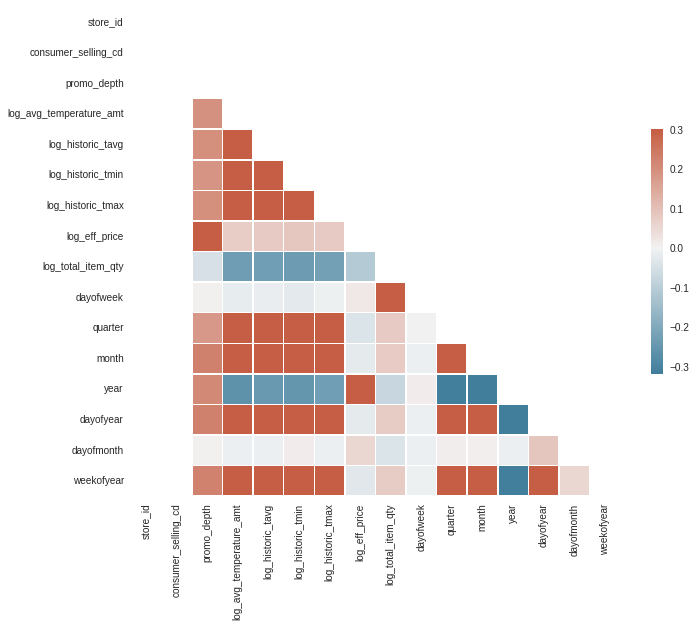

Calling xgboost_regression


In [ ]:
for e in unique_str_csc_list:

    store, csc = e[0], e[1]
    print(f"Processing store : {store} and csc : {csc}")

    csc_desc          = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['item_dsc'].values[0]
    smic_group_dsc    = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_dsc'].values[0]
    smic_group_cd     = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_cd'].values[0]
    smic_category_dsc = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_dsc'].values[0]
    smic_category_cd = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_cd'].values[0]
    smic_grp_info    = str(smic_group_cd) + '-' + smic_group_dsc
    smic_ctg_info    = str(smic_category_cd) + '-' + smic_category_dsc
    csc_info         = str(csc) + '-' + csc_desc
    print(csc_info, smic_ctg_info)

    print("Length of train data : ", len(df_train[(df_train.store_id == store) & (df_train.consumer_selling_cd == csc)]))
    print("Length of test data : ", len(df_test[(df_test.store_id == store) & (df_test.consumer_selling_cd == csc)]))
    #print("Length of val data : ", len(df_val[(df_val.store_id == store) & (df_val.consumer_selling_cd == csc)]))
    
    df_train_modified = df_train[(df_train.store_id == store) & (df_train.consumer_selling_cd == csc)]
    df_test_modified = df_test[(df_test.store_id == store) & (df_test.consumer_selling_cd == csc)]
    #df_val_modified = df_val[(df_val.store_id == store) & (df_val.consumer_selling_cd == csc)]

    train_indices = df_train_modified.index
    test_indices = df_test_modified.index
    #val_indices = df_val_modified.index

    X_train = df_train_modified[x_cols].values
    y_train = df_train_modified[y_col].values

    #X_val = df_val_modified[x_cols].values
    #y_val = df_val_modified[y_col].values

    X_test = df_test_modified[x_cols].values
    y_test = df_test_modified[y_col].values

    corr = df_train_modified.corr()
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})
    plt.show(block = False)

    print("Calling xgboost_regression")
    y_test_combined_xgbmr = xgboost_regression(X_train, y_train, X_test, y_test, test_indices, store, csc, csc_info, smic_ctg_info, smic_ctg_info)
    df_test_actual_vs_predicted_xgbmr = df_test_actual_vs_predicted_xgbmr.append(y_test_combined_xgbmr)

    print("Calling lightgbm_regression")
    y_test_combined_lgbmr = lightgbm_regression(X_train, y_train, X_test, y_test, test_indices, store, csc, csc_info, smic_ctg_info, smic_ctg_info)
    df_test_actual_vs_predicted_lgbmr = df_test_actual_vs_predicted_lgbmr.append(y_test_combined_lgbmr)
    
    print("Calling catboost_regression")
    y_test_combined_cbstr = catboost_regression(X_train, y_train, X_test, y_test, test_indices, store, csc, csc_info, smic_ctg_info, smic_ctg_info)
    df_test_actual_vs_predicted_cbstr = df_test_actual_vs_predicted_cbstr.append(y_test_combined_cbstr)

In [ ]:
df_test_actual_vs_predicted_xgbmr.index, df_test_actual_vs_predicted_lgbmr.index, df_test_actual_vs_predicted_cbstr.index

In [ ]:
df_feature_importance_xgbmr = pd.DataFrame(feature_importance_xgbmr_list)
df_feature_importance_xgbmr.columns = ['store_id', 'csc', 'csc_info', 'smic_ctg_info'] + [col + '_feature_importance' for col in x_cols]

df_feature_importance_lgbmr = pd.DataFrame(feature_importance_lgbmr_list)
df_feature_importance_lgbmr.columns = ['store_id', 'csc', 'csc_info', 'smic_ctg_info'] + [col + '_feature_importance' for col in x_cols]

df_feature_importance_cbstr = pd.DataFrame(feature_importance_cbstr_list)
df_feature_importance_cbstr.columns = ['store_id', 'csc', 'csc_info', 'smic_ctg_info'] + [col + '_feature_importance' for col in x_cols]

In [ ]:
df_test_actual_vs_predicted_xgbmr['y_test_actual_transformed'] = df_test_actual_vs_predicted_xgbmr['y_test_actual'].apply(lambda x : np.round(np.exp(x) - 1))
df_test_actual_vs_predicted_xgbmr['y_test_predicted_transformed'] = df_test_actual_vs_predicted_xgbmr['y_test_predicted'].apply(lambda x : np.round(np.exp(x) - 1))

df_test_actual_vs_predicted_lgbmr['y_test_actual_transformed'] = df_test_actual_vs_predicted_lgbmr['y_test_actual'].apply(lambda x : np.round(np.exp(x) - 1))
df_test_actual_vs_predicted_lgbmr['y_test_predicted_transformed'] = df_test_actual_vs_predicted_lgbmr['y_test_predicted'].apply(lambda x : np.round(np.exp(x) - 1))

df_test_actual_vs_predicted_cbstr['y_test_actual_transformed'] = df_test_actual_vs_predicted_cbstr['y_test_actual'].apply(lambda x : np.round(np.exp(x) - 1))
df_test_actual_vs_predicted_cbstr['y_test_predicted_transformed'] = df_test_actual_vs_predicted_cbstr['y_test_predicted'].apply(lambda x : np.round(np.exp(x) - 1))

In [ ]:
wmape_list_xgbmr = df_test_actual_vs_predicted_xgbmr.groupby(['store_id','csc']).apply(lambda x: weighted_mape(x['y_test_actual_transformed'], x['y_test_predicted_transformed']))
wmape_list_xgbmr = np.asarray(wmape_list_xgbmr)
wmape_list_xgbmr = [e.numpy() for e in wmape_list_xgbmr]

df_kpi_xgbmr = df_test_actual_vs_predicted_xgbmr[['store_id', 'csc']].drop_duplicates().reset_index().iloc[:,1:]
df_kpi_xgbmr['wmape'] = wmape_list_xgbmr
df_kpi_xgbmr['accuracy'] = 100 - df_kpi_xgbmr['wmape']
df_kpi_xgbmr.sort_values(by=['accuracy'], ascending = False)

In [ ]:
wmape_list_lgbmr = df_test_actual_vs_predicted_lgbmr.groupby(['store_id','csc']).apply(lambda x: weighted_mape(x['y_test_actual_transformed'], x['y_test_predicted_transformed']))
wmape_list_lgbmr = np.asarray(wmape_list_lgbmr)
wmape_list_lgbmr = [e.numpy() for e in wmape_list_lgbmr]

df_kpi_lgbmr = df_test_actual_vs_predicted_lgbmr[['store_id', 'csc']].drop_duplicates().reset_index().iloc[:,1:]
df_kpi_lgbmr['wmape'] = wmape_list_lgbmr
df_kpi_lgbmr['accuracy'] = 100 - df_kpi_lgbmr['wmape']
df_kpi_lgbmr.sort_values(by=['accuracy'], ascending = False)

In [ ]:
wmape_list_cbstr = df_test_actual_vs_predicted_cbstr.groupby(['store_id','csc']).apply(lambda x: weighted_mape(x['y_test_actual_transformed'], x['y_test_predicted_transformed']))
wmape_list_cbstr = np.asarray(wmape_list_cbstr)
wmape_list_cbstr = [e.numpy() for e in wmape_list_cbstr]

df_kpi_cbstr = df_test_actual_vs_predicted_cbstr[['store_id', 'csc']].drop_duplicates().reset_index().iloc[:,1:]
df_kpi_cbstr['wmape'] = wmape_list_cbstr
df_kpi_cbstr['accuracy'] = 100 - df_kpi_cbstr['wmape']
df_kpi_cbstr.sort_values(by=['accuracy'], ascending = False)

In [ ]:
np.exp(1.92986488)-1, np.exp(2.63905733)-1, np.log(5.88857942 + 1)

In [ ]:
df_test_actual_vs_predicted_lgbmr[(df_test_actual_vs_predicted_lgbmr.store_id == 326) & (df_test_actual_vs_predicted_lgbmr.csc.isin([461103]))][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

In [ ]:
df_test_actual_vs_predicted_xgbmr[(df_test_actual_vs_predicted_xgbmr.store_id == 326) & (df_test_actual_vs_predicted_xgbmr.csc.isin([461103]))][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

In [ ]:
df_upc_2[df_upc_2.consumer_selling_cd == 322045]

In [ ]:
df_txn[(df_txn.store_id == 619) & (df_txn.consumer_selling_cd.isin([322045]))].set_index('txn_dte')['total_item_qty'].plot(figsize=(30,8))

In [ ]:
df_test_actual_vs_predicted_cbstr[(df_test_actual_vs_predicted_cbstr.store_id == 619) & (df_test_actual_vs_predicted_cbstr.csc.isin([322045]))][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

In [ ]:
df_test_actual_vs_predicted_lgbmr[(df_test_actual_vs_predicted_lgbmr.store_id == 619) & (df_test_actual_vs_predicted_lgbmr.csc.isin([322045]))][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

In [ ]:
df_test_actual_vs_predicted_xgbmr[(df_test_actual_vs_predicted_xgbmr.store_id == 619) & (df_test_actual_vs_predicted_xgbmr.csc.isin([322045]))][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

In [ ]:
df_test_actual_vs_predicted_lgbmr[(df_test_actual_vs_predicted_lgbmr.store_id == 619) & (df_test_actual_vs_predicted_lgbmr.csc.isin([322087]))][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

In [ ]:
df_test_actual_vs_predicted_xgbmr[(df_test_actual_vs_predicted_xgbmr.store_id == 619) & (df_test_actual_vs_predicted_xgbmr.csc.isin([322087]))][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

In [ ]:
df_test_actual_vs_predicted_lgbmr[(df_test_actual_vs_predicted_lgbmr.store_id == 326) & (df_test_actual_vs_predicted_lgbmr.csc == 461103)][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

In [ ]:
df_test_actual_vs_predicted_xgbmr[(df_test_actual_vs_predicted_xgbmr.store_id == 326) & (df_test_actual_vs_predicted_xgbmr.csc == 461103)][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

In [ ]:
df_test_actual_vs_predicted_lgbmr[(df_test_actual_vs_predicted_lgbmr.store_id == 619) & (df_test_actual_vs_predicted_lgbmr.csc == 146385)][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

In [ ]:
df_test_actual_vs_predicted_xgbmr[(df_test_actual_vs_predicted_xgbmr.store_id == 619) & (df_test_actual_vs_predicted_xgbmr.csc == 146385)][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

In [ ]:
df_test_actual_vs_predicted_xgbmr_copy = df_test_actual_vs_predicted_xgbmr.reset_index().copy()
df_test_actual_vs_predicted_lgbmr_copy = df_test_actual_vs_predicted_lgbmr.reset_index().copy()
df_test_actual_vs_predicted_cbstr_copy = df_test_actual_vs_predicted_cbstr.reset_index().copy()

df_test_actual_vs_predicted_xgbmr_copy.columns = ['day_dt', 'y_test_actual_xgbmr', 'y_test_predicted_xgbmr', 'store_id', 'csc', 'y_test_actual_transformed_xgbmr', 'y_test_predicted_transformed_xgbmr']
df_test_actual_vs_predicted_lgbmr_copy.columns = ['day_dt', 'y_test_actual_lgbmr', 'y_test_predicted_lgbmr', 'store_id', 'csc', 'y_test_actual_transformed_lgbmr', 'y_test_predicted_transformed_lgbmr']
df_test_actual_vs_predicted_cbstr_copy.columns = ['day_dt', 'y_test_actual_lgbmr', 'y_test_predicted_lgbmr', 'store_id', 'csc', 'y_test_actual_transformed_cbstr', 'y_test_predicted_transformed_cbstr']

df_stacked = pd.merge(df_test_actual_vs_predicted_xgbmr_copy, df_test_actual_vs_predicted_lgbmr_copy, df_test_actual_vs_predicted_cbstr_copy, how = 'inner', on = ['day_dt', 'store_id', 'csc'])
df_stacked['stacked_prediction'] = df_stacked.apply(lambda x : np.round((x.y_test_predicted_transformed_xgbmr + x.y_test_predicted_transformed_lgbmr + x.y_test_predicted_transformed_cbstr) / 2), axis = 1)
df_stacked

In [ ]:
df_stacked_refined = df_stacked[['day_dt', 'store_id', 'csc', 'y_test_actual_transformed_xgbmr', 'stacked_prediction']]
#df_stacked_refined.set_index('day_dt', inplace = True)
df_stacked_refined.columns = ['day_dt', 'store_id', 'csc', 'y_test_actual_transformed', 'y_test_predicted_transformed']

wmape_list_stacked = df_stacked.groupby(['store_id','csc']).apply(lambda x: weighted_mape(x['y_test_actual_transformed_xgbmr'], x['stacked_prediction']))
wmape_list_stacked = np.asarray(wmape_list_stacked)
wmape_list_stacked = [e.numpy() for e in wmape_list_stacked]

df_kpi_stacked = df_stacked[['store_id', 'csc']].drop_duplicates().reset_index().iloc[:,1:]
df_kpi_stacked['wmape'] = wmape_list_stacked
df_kpi_stacked['accuracy'] = 100 - df_kpi_stacked['wmape']
df_kpi_stacked.sort_values(by=['accuracy'], ascending = False)

# ***Aggregate Forecast to Week Level***

In [ ]:
df_train.columns

In [ ]:
df_txn_weekly = pd.merge(df_txn[df_txn.txn_dte <= '2022-04-30'], df_day_week, how = 'inner', left_on = 'txn_dte', right_on = 'date_val').groupby(['week_start_date', 'week_end_date', 'store_id', 'consumer_selling_cd']).agg({'total_item_qty' : np.sum}).reset_index()
#df_txn_weekly['week_end_date'] = pd.to_datetime(df_txn_weekly['week_end_date'])
df_txn_weekly.set_index('week_end_date', inplace = True)
df_txn_weekly.iloc[0]

In [ ]:
#df_fcst_actual_week = pd.merge(df_test_actual_vs_predicted_xgbmr.reset_index(), df_day_week, how = 'inner', left_on = 'day_dt', right_on = 'date_val')
df_fcst_actual_week = pd.merge(df_stacked_refined.reset_index(), df_day_week, how = 'inner', left_on = 'day_dt', right_on = 'date_val')

In [ ]:
df_fcst_actual_week.columns

In [ ]:
df_fcst_actual_week.iloc[0]

In [ ]:
df_fcst_actual_week_refined = df_fcst_actual_week[['store_id', 'csc', 'day_dt', 'y_test_actual_transformed', 'y_test_predicted_transformed', 'week_start_date', 'week_end_date']]

In [ ]:
df_fcst_actual_week_refined.iloc[0]

In [ ]:
df_test_act_vs_pred_wkly = df_fcst_actual_week_refined.groupby(['store_id', 'csc', 'week_start_date', 'week_end_date']).agg({'y_test_actual_transformed' : np.sum, 'y_test_predicted_transformed' : np.sum}).reset_index()

In [ ]:
df_fcst_actual_week_refined

In [ ]:
df_test_act_vs_pred_wkly

In [ ]:
df_kpi_wkly = df_test_act_vs_pred_wkly[['store_id', 'csc']].drop_duplicates()
wkly_wmape_list = df_test_act_vs_pred_wkly.groupby(['store_id','csc']).apply(lambda x: weighted_mape(x['y_test_actual_transformed'], x['y_test_predicted_transformed']))

wkly_wmape_list = np.asarray(wkly_wmape_list)
wkly_wmape_list = [e.numpy() for e in wkly_wmape_list]
wkly_wmape_list

df_kpi_wkly['wmape_wkly'] = wkly_wmape_list
df_kpi_wkly['accuracy_wkly'] = 100 - df_kpi_wkly['wmape_wkly']
df_kpi_wkly.sort_values(by=['accuracy_wkly'], ascending = False, inplace = True)
df_kpi_wkly

In [ ]:
df_test_act_vs_pred_wkly.columns

In [ ]:
df_test_act_vs_pred_wkly.index

In [ ]:
orig_df_test_act_vs_pred_wkly = df_test_act_vs_pred_wkly.copy()

In [ ]:
df_test_act_vs_pred_wkly = pd.merge(df_test_act_vs_pred_wkly, df_str_zip, how='inner', on = ['store_id'])
df_test_act_vs_pred_wkly

In [ ]:
df_wkly = pd.merge(df_test_act_vs_pred_wkly, df_wkly_weather_stats, how = 'inner', on = ['zip5', 'store_id', 'week_start_date', 'week_end_date'])
df_wkly = pd.merge(df_wkly, df_upc_2[['consumer_selling_cd', 'item_dsc', 'smic_group_cd', 'smic_group_dsc', 'smic_category_cd', 'smic_category_dsc']], how = 'inner', left_on = 'csc', right_on = 'consumer_selling_cd')
df_wkly.drop(columns = ['consumer_selling_cd'], inplace = True)
#df_wkly.set_index(['week_end_date'], inplace = True)
df_wkly.iloc[0]

In [ ]:
df_wkly.index

In [ ]:
df_wkly_weather_stats.columns

In [ ]:
df_txn_weekly[(df_txn_weekly.store_id == 619) & (df_txn_weekly.consumer_selling_cd == 413364)]

In [ ]:
df_wkly

In [ ]:
#fig, ax = plt.subplots(figsize=(20, 9))
#sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(20,9)})

ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619], x ='week_end_date', y = 'wkly_avg_high_temperature_amt',
                  palette='viridis',
                  lw=3)
ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619], x ='week_end_date', y = 'wkly_avg_temperature_amt',
                  palette='viridis',
                  lw=3)
ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619], x ='week_end_date', y = 'wkly_avg_low_temperature_amt',
                  palette='viridis',
                  lw=3)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].wkly_avg_high_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].wkly_avg_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].index, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 619].wkly_avg_low_temperature_amt)

ax = sns.lineplot(data=df_txn_weekly[(df_txn_weekly.store_id == 619) & (df_txn_weekly.consumer_selling_cd == 413364)].reset_index(), x ='week_end_date', y = 'total_item_qty',
                  palette='magma',
                  lw=3)
ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == 619) & (df_wkly.csc == 413364)], x ='week_end_date', y = 'y_test_actual_transformed',
                  palette='magma',
                  lw=3)
ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == 619) & (df_wkly.csc == 413364)], x ='week_end_date', y = 'y_test_predicted_transformed',
                  palette='magma',
                  lw=3)
ax.vlines(x=120, ymin=-10, ymax=100, color='black', ls='solid', linewidth = 4)

ax.xaxis.set_major_locator(ticker.MultipleLocator(12))
plt.legend(bbox_to_anchor=(1, 1))
plt.xlabel('Date')
plt.show()

In [ ]:
df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].head()

In [ ]:
df_wkly_weather_stats.iloc[0]

In [ ]:
#fig, ax = plt.subplots(figsize=(20, 9))
#sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(20,9)})

ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326], x ='week_end_date', y = 'wkly_avg_high_temperature_amt',
                  palette='viridis',
                  lw=3)
ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326], x ='week_end_date', y = 'wkly_avg_temperature_amt',
                  palette='viridis',
                  lw=3)
ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326], x ='week_end_date', y = 'wkly_avg_low_temperature_amt',
                  palette='viridis',
                  lw=3)

ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].week_end_date, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_high_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].week_end_date, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].week_end_date, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_low_temperature_amt)

ax = sns.lineplot(data=df_txn_weekly[(df_txn_weekly.store_id == 326) & (df_txn_weekly.consumer_selling_cd == 778229)].reset_index(), x ='week_end_date', y = 'total_item_qty',
                  palette='magma',
                  lw=3)
ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == 326) & (df_wkly.csc == 778229)], x ='week_end_date', y = 'y_test_actual_transformed',
                  palette='magma',
                  lw=3)
ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == 326) & (df_wkly.csc == 778229)], x ='week_end_date', y = 'y_test_predicted_transformed',
                  palette='magma',
                  lw=3)
ax.vlines(x=120, ymin=-10, ymax=100, color='black', ls='solid', linewidth = 4)

ax.xaxis.set_major_locator(ticker.MultipleLocator(12))

plt.legend(bbox_to_anchor=(1, 1))
plt.xlabel('Date')
plt.show()

In [ ]:
#fig, ax = plt.subplots(figsize=(20, 9))
#sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(20,9)})

ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326], x ='week_end_date', y = 'wkly_avg_high_temperature_amt',
                  palette='viridis',
                  lw=3)
ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326], x ='week_end_date', y = 'wkly_avg_temperature_amt',
                  palette='viridis',
                  lw=3)
ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326], x ='week_end_date', y = 'wkly_avg_low_temperature_amt',
                  palette='viridis',
                  lw=3)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].week_end_date, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_high_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].week_end_date, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_temperature_amt)
ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].week_end_date, df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == 326].wkly_avg_low_temperature_amt)

ax = sns.lineplot(data=df_txn_weekly[(df_txn_weekly.store_id == 326) & (df_txn_weekly.consumer_selling_cd == 146761)].reset_index(), x ='week_end_date', y = 'total_item_qty',
                  palette='magma',
                  lw=3)
ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == 326) & (df_wkly.csc == 146761)], x ='week_end_date', y = 'y_test_actual_transformed',
                  palette='magma',
                  lw=3)
ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == 326) & (df_wkly.csc == 146761)], x ='week_end_date', y = 'y_test_predicted_transformed',
                  palette='magma',
                  lw=3)
ax.vlines(x=120, ymin=-10, ymax=100, color='black', ls='solid', linewidth = 4)

ax.xaxis.set_major_locator(ticker.MultipleLocator(12))
#plt.legend(bbox_to_anchor=(1, 1))
plt.xlabel('Date')
plt.show()

In [ ]:
df_wkly.sort_index(inplace=True)
df_wkly = pd.merge(df_wkly, df_upc[['consumer_selling_cd', 'smic_category_id']], how = 'inner', left_on = 'csc', right_on = 'consumer_selling_cd')
df_wkly.drop(columns = ['consumer_selling_cd'], axis = 1, inplace = True)
df_wkly.sort_values(by=['week_start_date', 'store_id', 'smic_category_id', 'csc'], inplace = True)

In [ ]:
df_wkly.columns

In [ ]:
df_wkly.index

In [ ]:
for e in df_wkly[['store_id', 'csc']].drop_duplicates().values:
    store_id = e[0]
    csc = e[1]
    csc_desc          = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['item_dsc'].values[0]
    smic_group_dsc    = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_dsc'].values[0]
    smic_group_cd     = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_group_cd'].values[0]
    smic_category_dsc = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_dsc'].values[0]
    smic_category_cd = df_upc_2[df_upc_2['consumer_selling_cd'] == csc]['smic_category_cd'].values[0]
    smic_grp_info    = str(smic_group_cd) + '-' + smic_group_dsc
    smic_ctg_info    = str(smic_category_cd) + '-' + smic_category_dsc
    csc_info         = str(csc) + '-' + csc_desc
    accuracy = df_kpi_wkly[(df_kpi_wkly.store_id == store_id) & (df_kpi_wkly.csc == csc)]['accuracy_wkly'].values[0]
    #print(store_id, csc_info, smic_ctg_info)

    #fig, ax = plt.subplots(figsize=(20, 9))
    #sns.set_style('darkgrid')
    sns.set(rc={'figure.figsize':(20,8)})

    ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id], 
                      x ='week_end_date', 
                      y = 'wkly_avg_high_temperature_amt',
                      palette='viridis',
                      lw=3)
    ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id], 
                      x ='week_end_date', 
                      y = 'wkly_avg_temperature_amt',
                      palette='viridis',
                      lw=3)
    ax = sns.lineplot(data=df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id], 
                      x ='week_end_date', 
                      y = 'wkly_avg_low_temperature_amt',
                      palette='viridis',
                      lw=3)
    ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].week_end_date, 
                    df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].wkly_avg_high_temperature_amt)
    ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].week_end_date, 
                    df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].wkly_avg_temperature_amt)
    ax.fill_between(df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].week_end_date, 
                    df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id].wkly_avg_low_temperature_amt)

    ax = sns.lineplot(data=df_txn_weekly[(df_txn_weekly.store_id == store_id) & (df_txn_weekly.consumer_selling_cd == csc)].reset_index(), 
                      x ='week_end_date', 
                      y = 'total_item_qty',
                      palette='magma',
                      lw=3)
    ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == store_id) & (df_wkly.csc == csc)], 
                      x ='week_end_date', 
                      y = 'y_test_actual_transformed',
                      palette='magma',
                      lw=3)
    ax = sns.lineplot(data=df_wkly[(df_wkly.store_id == store_id) & (df_wkly.csc == csc)], 
                      x ='week_end_date', 
                      y = 'y_test_predicted_transformed',
                      palette='magma',
                      lw=3)
    ax.vlines(x=120, 
              ymin=-10, 
              ymax=max(df_txn_weekly[(df_txn_weekly.store_id == store_id) & (df_txn_weekly.consumer_selling_cd == csc)]['total_item_qty'].max(),
                       df_wkly[(df_wkly.store_id == store_id) & (df_wkly.csc == csc)]['y_test_actual_transformed'].max(),
                       df_wkly[(df_wkly.store_id == store_id) & (df_wkly.csc == csc)]['y_test_predicted_transformed'].max(),
                       df_wkly_weather_stats[df_wkly_weather_stats.store_id.astype(int) == store_id]['wkly_avg_high_temperature_amt'].max()
                      ), 
              color='black', 
              ls='solid', 
              linewidth = 4)

    ax.xaxis.set_major_locator(ticker.MultipleLocator(12))
    #plt.legend(bbox_to_anchor=(1, 1))
    plt.xlabel('Date')
    
    #plt.figure(figsize=(200, 100))
    #df_wkly[(df_wkly.store_id == store_id) & (df_wkly.csc == csc)][['y_test_actual_transformed', 'y_test_predicted_transformed', 'wkly_avg_high_temperature_amt', 'wkly_avg_low_temperature_amt', 'wkly_avg_temperature_amt']].plot(figsize=(10, 8))
    #plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    title_string = f"Weekly Forecast Vs Actual along with Weather for store {store_id.astype(str).zfill(5)} and csc {csc_info}, {smic_grp_info}\nForecast accuracy at store-csc-week level {np.round(accuracy)}%"
    #subtitle_string = f"Forecast accuracy at store-csc-week level {np.round(accuracy)}%"
    plt.suptitle(title_string, y=1.00, fontsize=18)
    #plt.title(subtitle_string, y=1.00, fontsize=17)
    plt.savefig('plot_'+ str(store_id).zfill(5) + '_csc_' + str(csc) + '.png')
    plt.show(block = False)
    #plt.savefig('plot_'+ str(store_id).zfill(5) + '_csc_' + str(csc) + '.png')
    #plt.savefig('plot_'+ str(store_id).zfill(5) + '_csc_' + str(csc) + '.pdf', dpi=300)


In [ ]:
df_wkly.head()

In [ ]:
df_wkly.sort_values(by=['week_end_date', 'smic_group_cd', 'csc'], inplace = True)
df_wkly.to_csv('weekly_forecast.csv')

In [ ]:
df_kpi_wkly_extended = pd.merge(df_kpi_wkly, df_upc_2[['consumer_selling_cd','item_dsc','smic_group_dsc','smic_group_cd','smic_category_dsc','smic_category_cd']], how='inner', left_on='csc', right_on='consumer_selling_cd')
df_kpi_wkly_extended.drop(columns = ['consumer_selling_cd'], axis = 1, inplace = True)
df_kpi_wkly_extended

In [ ]:
df_kpi_wkly_extended.groupby(['store_id', 'smic_group_cd']).agg({'accuracy_wkly' : [np.max,np.mean,np.median,np.min]})

In [ ]:
df_kpi_wkly_extended.groupby(['store_id', 'smic_group_cd', 'smic_category_cd']).agg({'accuracy_wkly' : [np.max,np.mean,np.median,np.min]})

In [ ]:
from PIL import Image
import glob
imagelist = []

for idx, image_file_name in enumerate(glob.glob('*.png')):
    #print(image_file_name)
    image = Image.open(image_file_name)
    converted_image = image.convert('RGB')
    imagelist.append(converted_image)
converted_image.save(r'merged_images.pdf',save_all=True, append_images=imagelist[:-1])

# ***End of my experimentation***